# **Phase 2: Fine-tuning selected Models**

# **SpillNet: Fine-Grained Classification of Household and Office Spill Images Using Deep Learning**

## Overview
This project, SpillNet, addresses the nuanced challenge of fine-grained image classification for common household and office spills. The inherent difficulty lies in the subtle visual distinctions between spill types (e.g., water vs. alcohol) and similarities across different categories under various conditions. The goal is to to develop a robust deep learning solution using pre-trained Convolutional Neural Network (CNN) architectures to classify spills like alcohol, coffee, coke, detergent, and others with high accuracy. Fine-grained classification requires models to capture detailed, distinguishing features, making it an ideal candidate to benchmark the performance of sophisticated convolutional neural network (CNN) architectures.

## Objectives
- **Dataset Collection:** To create a realistic scenario, images were captured manually using an iPhone camera, mimicking real-world conditions such as varied lighting, camera angles, and backgrounds.
- **Pre-trained Model Selection:** Leveraging pre-trained CNN architectures allows us to take advantage of rich feature extraction capabilities learned from large-scale datasets such as ImageNet, significantly reducing training time and enhancing performance.
- **Fine-Tuning Selected Models (Current Work):** Fine-tune pretrained models (***VGG16*** and ***ResNet50***) on our spill classification dataset.
- **Model Evaluation & Comparison**: By systematically implementing performance evaluation on the models generated by using different **fine-tuning** strategies (*freezing layers*, *learning rates*, *data augmentation*) and doing comparison analysis, I aim to identify the best model configuration suitable for fine-grained spill classification.

## Current Phase - II
This work actually demonstrates the second phase of this project - the process of **fine-tuning pretrained models** for classifying different types of spills in images. Building upon the initial dataset collection and preprocessing, this phase delves into adapting established CNN architectures—specifically **VGG16** and **ResNet50** — to the unique characteristics of our spill image dataset. I will explore a variety of fine-tuning strategies to optimize their performance for this specialized classification task. These models were chosen for their proven track records in image recognition and their differing architectural philosophies, providing a good basis for comparison."

## Approach
My  approach is rooted in systematic experimentation to identify the most effective techniques for fine-grained spill classification. I will investigate the influence of several key factors:
1. **Model architectures**: Comparing VGG16 (known for its simpler, sequential architecture) and ResNet50 (notable for its deeper structure and residual connections that aid in training).
2. **Freezing strategies**: Determining the optimal number of pre-trained layers to freeze. This balances leveraging learned ImageNet features against allowing the model to adapt to the specific details of the spill dataset.
3. **Learning rate schedulers**: Evaluating different methods for dynamically adjusting the learning rate during training, which can significantly impact convergence speed and final model performance.
4. **Data augmentation**: Assessing the impact of advanced data augmentation techniques versus simpler baseline preprocessing to enhance model generalization and mitigate overfitting, especially given our custom, moderately-sized dataset.

## Dataset Collection and Preparation

### Dataset Overview
Manual dataset collection was specifically chosen to reflect authentic real-world diversity and complexity, significantly impacting model robustness. By capturing multiple spill categories (e.g., coffee, detergent, oil), I created a rich dataset that encompasses variability in color, texture, and surface interactions.

I collected spill images manually using my iPhone camera. Each image represents a spill from one of 22 categories, captured under different lighting conditions and angles. Each class represents common household and office substances, carefully selected based on their frequent occurrence and visual ambiguity. The categories include:

`gatorade_red, red_colored_water, gatorade_blue, dishwashing_liquid, liquid_detergent, gatorade_purple, mouth_wash, hand_wash, vinegar, water, alcohol, sprite, sparkling_water, gatorade_watermelon, glass_cleaner, soy_sauce, fish_sauce, coke, fanta, oil, coffee, milk`

The directory structure is organized as follows:
```bash
data/
├── images/
│   ├── alcohol/            # Each subdirectory corresponds to a spill class
│   │   ├── alcohol_1.heif 
│   │   └── ...             # HEIF format from iPhone, other formats also supported
│   ├── coffee/
│   │   ├── coffee_1.heif
│   │   └── ...
│   └── ...
├── images_box.txt          # Annotations for bounding boxes
```
The `images_box.txt` contains the bounding boxes annotations generated from VGG Image Annotator tool. These allow the model to optionally focus on the specific spill region, potentially improving accuracy by reducing background noise. 

**Note:** I have used bounding box feature only during training.

### **Handling HEIF Image Formats**
Images captured using iPhones often have the HEIF format, which Pillow does not natively support. To handle these, we use the `pillow_heif` library as shown below:

In [1]:
%pip install pillow-heif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 58.8 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import torch
import random
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import cv2
from pillow_heif import register_heif_opener

register_heif_opener()

## **Dataset Preparation**

I have defined a custom PyTorch dataset class, `SpillsDataset`, for loading and preprocessing the spill images with optional bounding box cropping.

### **Implementation:**
- Hierarchical directory structure enables automatic class recognition.
- Supports multiple image formats (HEIF, PNG, JPG, JPEG).
- Stratified splitting preserves class distribution across splits.
- Dynamically handles dataset splits (train, validation, test).
- Seed control ensures reproducible data splits.
- Applies bounding box cropping to focus on spill regions.
- Incorporates data augmentation to enhance model generalization
- Streamlines data loading and preprocessing procedures, facilitating efficient experimentation

In [3]:
class SpillsDataset(Dataset):
    """
    Custom Dataset for Spills Classification with Dynamic Splitting
    Directory Structure:
        root/
        ├── images/
        │   ├── alcohol/
        │   │   ├── alcohol_1.heif
        │   │   └── ...
        │   ├── coffee/
        │   │   ├── coffee_1.heif
        │   │   └── ...
        │   └── ...
        ├── images_box.txt (bounding box annotations)
    """
    
    def __init__(self, root, mode='train', transform=None, 
                 bounding_box_crop=False, split_ratios=(0.6, 0.1, 0.3),
                 random_seed=42):
        """
        Args:
            root (str): Root directory path
            mode (str): One of 'train', 'val', 'test'
            transform (callable): Optional transform
            bounding_box_crop (bool): Apply bounding box crop
            split_ratios (tuple): (train, val, test) ratios
            random_seed (int): Seed for reproducible splits
        """
        self.root = root
        self.mode = mode
        self.transform = transform
        self.bounding_box_crop = bounding_box_crop
        self.split_ratios = split_ratios
        self.random_seed = random_seed

        # Load class names and create mappings
        self.classes = sorted([d.name for d in os.scandir(os.path.join(root, 'images')) if d.is_dir()])
        self.class_to_idx = {cls: i for i, cls in enumerate(self.classes)}
        self.idx_to_class = {v: k for k, v in self.class_to_idx.items()}

        # Load bounding boxes
        self.bboxes = self._load_bounding_boxes()

        # Load and split dataset
        self.samples = self._load_and_split_data()

    def _load_bounding_boxes(self):
        """Load bounding boxes from images_box.txt"""
        bboxes = {}
        with open(os.path.join(self.root, 'images_box.txt'), 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                img_id, xmin, ymin, xmax, ymax = parts
                bboxes[img_id] = (int(xmin), int(ymin), int(xmax), int(ymax))
        return bboxes

    def _load_and_split_data(self):
        """Load all images and perform stratified splitting"""
        # Collect all samples with (path, class_idx)
        all_samples = []
        for cls in self.classes:
            cls_dir = os.path.join(self.root, 'images', cls)
            for img_name in os.listdir(cls_dir):
                if img_name.lower().endswith(('heif', '.png', '.jpg', '.jpeg')):
                    img_id = os.path.splitext(img_name)[0]
                    all_samples.append((
                        os.path.join(cls_dir, img_name),
                        self.class_to_idx[cls],
                        img_id
                    ))

        # Split into train+val and test first
        train_val_samples, test_samples = train_test_split(
            all_samples,
            test_size=self.split_ratios[2],
            stratify=[s[1] for s in all_samples],
            random_state=self.random_seed
        )

        # Split remaining into train and val
        train_samples, val_samples = train_test_split(
            train_val_samples,
            test_size=self.split_ratios[1]/(1-self.split_ratios[2]),
            stratify=[s[1] for s in train_val_samples],
            random_state=self.random_seed
        )

        # Select appropriate split
        if self.mode == 'train':
            return train_samples
        elif self.mode == 'val':
            return val_samples
        elif self.mode == 'test':
            return test_samples
        else:
            raise ValueError(f"Invalid mode: {self.mode}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label, img_id = self.samples[idx]
        
        # Load image
        img = Image.open(img_path).convert('RGB')
        
        # Apply bounding box crop
        if self.bounding_box_crop:
            bbox = self.bboxes.get(img_id)
            if bbox:
                img = img.crop(bbox)
            else:
                print(f"Warning: No bounding box found for {img_id}")

        # Apply transforms
        if self.transform:
            img = self.transform(img)

        return img, label

In [4]:
# Define transformation pipelines
train_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

test_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

# Create datasets
train_dataset = SpillsDataset(
    root='/kaggle/input/spills-dataset/data/',
    mode='train',
    transform=train_transform,
    bounding_box_crop=False
)

val_dataset = SpillsDataset(
    root='/kaggle/input/spills-dataset/data/',
    mode='val',
    transform=test_transform,
    bounding_box_crop=False
)

test_dataset = SpillsDataset(
    root='/kaggle/input/spills-dataset/data/',
    mode='test',
    transform=test_transform,
    bounding_box_crop=False
)

print(f"Length of Training Set:\t\t{len(train_dataset)}")
print(f"Length of Validation Set:\t{len(val_dataset)}")
print(f"Length of Testing Set:\t\t{len(test_dataset)}")

Length of Training Set:		329
Length of Validation Set:	56
Length of Testing Set:		165


### Data Statistics and Analysis:
- **Total Samples:** 550 images
    - **Training Set:** 329 samples (~60%)
    - **Validation Set:** 56 samples (~10%)
    - **Test Set:** 165 samples (~30%)

- **Split Ratios:** The data is divided approximately into a 60% training, 10% validation, and 30% testing split. This distribution is a common practice for datasets of this size, providing a substantial amount for model training, a smaller set for hyperparameter tuning and early stopping (validation), and a larger, completely unseen set for final unbiased performance evaluation. The stratified splitting helps maintain class balance across these sets.
- **Dataset Scale:** While not as extensive as large-scale benchmarks like ImageNet, this dataset size is typical for custom, fine-grained classification tasks and provides a good testbed for evaluating fine-tuning strategies.

## Visual Exploration of Dataset

Below, we visualize random samples from each dataset split to qualitatively assess data quality and ensure consistency across categories.

In [5]:
# ============================
# Visualization Function
# ============================

def visualize_samples(dataset, num_samples=6, title="Dataset Samples"):
    """
    Visualizes a few sample images from the dataset with de-normalization
    (assuming ImageNet mean/std).
    
    Requirements:
      - dataset.samples: list of tuples (rel_path, label_str) or something similar
      - dataset.rev_label_map: a dict mapping label_idx -> label_text
      - the dataset returns (transformed_image_tensor, label_idx) in __getitem__.
    """
    if len(dataset) == 0:
        print("Dataset is empty. Cannot visualize samples.")
        return
    
    num_samples = min(num_samples, len(dataset))
    # Randomly select distinct indices.
    sample_indices = random.sample(range(len(dataset)), num_samples)
    
    # Determine grid size.
    if num_samples <= 5:
        nrows = 1
        ncols = num_samples
    else:
        ncols = 5
        nrows = int(np.ceil(num_samples / ncols))
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
    axes = axes.flatten() if nrows * ncols > 1 else [axes]
    
    for i, idx in enumerate(sample_indices):
        # Retrieve the image/label from the dataset.
        image_tensor, label_idx = dataset[idx]
        
        # Reverse mapping to convert label index to label text.
        if hasattr(dataset, 'idx_to_class'):
            label_text = dataset.idx_to_class[label_idx]
        else:
            label_text = str(label_idx)
        
        # Retrieve the relative image path from dataset.samples.
        # The first element in that tuple is the relative path, e.g. "coffee/coffee_1.jpg".
        rel_path = dataset.samples[idx][0]
        img_name = os.path.basename(rel_path)  # e.g. "coffee_1.jpg"
        
        # Convert the tensor to NumPy array and de-normalize.
        img_np = image_tensor.numpy().transpose(1, 2, 0)
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_np = (img_np * std) + mean
        img_np = np.clip(img_np, 0, 1)
        
        # Display the image.
        axes[i].imshow(img_np)
        axes[i].set_title(f"{img_name}:\n {label_text}")
        axes[i].axis('off')
    
    # Remove any unused subplots if num_samples < len(axes).
    for j in range(num_samples, len(axes)):
        fig.delaxes(axes[j])
    
    plt.suptitle(title)
    plt.show()

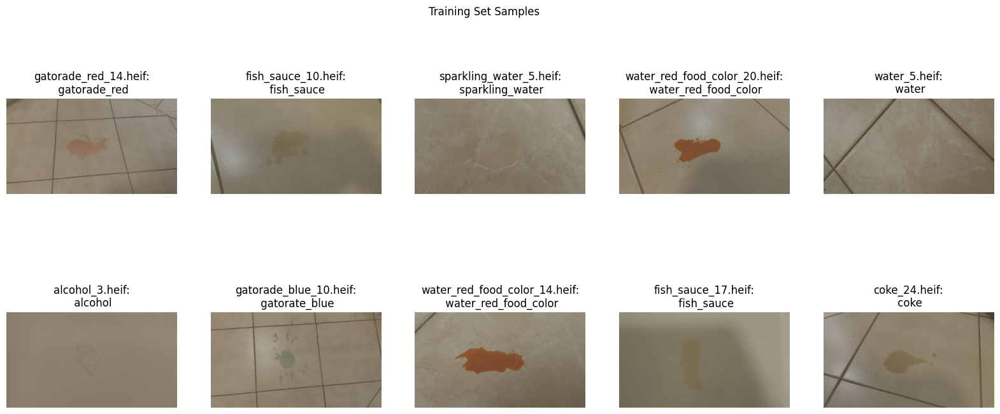

In [19]:
# Visualize samples
visualize_samples(dataset=train_dataset, num_samples=10, title='Training Set Samples')

### **Key Insights**
- Reveals class diversity and potential challenges:
  - Varying lighting conditions
  - Different spill scales/angles
  - Potential occlusion cases
- Normalization appears effective (proper intensity ranges)
- Bounding box implementation verified through visual inspection

## Pre-trained Model Selection

The core of my approach relies on fine-tuning, leveraging models pre-trained on the large-scale ImageNet dataset. This allows us to benefit from features learned on a vast and diverse set of images, significantly reducing the need for training from scratch and often leading to better performance, especially with limited custom data. We've selected two prominent CNN architectures:

- **VGG16**: I chose this model for its simplicity, ease of interpretation, and historical success in standard image classification tasks. It is known for its simplicity, straightforward structure, and decent performance on image classification tasks.
- **ResNet50**: I selected this model primarily for its deeper architecture with residual connections, enabling effective training of deeper networks. Residual connections mitigate the vanishing gradient problem, making it more suitable for complex fine-grained classification tasks.

Both models are pretrained on ImageNet, providing a strong initialization point for fine-tuning on our spills dataset.

## Model Implementation

I leveraged pre-trained CNN models by replacing the final classification layers to match our dataset categories. I have used `Adam` optimizer and `CrossEntropyLoss` criterion for training, and widely used base `learning rate` of $1e-4$ to ensure stable fine-tuning, preventing rapid divergence or oscillations.

### Imports and Setup

Now, we will import all the necessary libraries for data handling, model training, and visualization.

In [ ]:
import os
import time
import copy
import json
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from PIL import Image
from tqdm.notebook import tqdm
from IPython.display import Markdown, display

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision.models as models
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR, ReduceLROnPlateau

### Training Configuration

Here I have defined my training configuration including paths, hyperparameters, and device settings.

Data augmentation helps prevent model overfitting and improves generalization by artificially increasing dataset size and variety. Therefore, I have defined two types of data transformations to conduct data augmentation experiments:
1. **Advanced transformations**: Include various data augmentation techniques like random flips, rotations, crops, and color jittering to improve model generalization
2. **Baseline transformations**: Simple resize and center crop operations, used for comparison and evaluation

Both transformations include normalization using ImageNet mean and standard deviation values since we're using pretrained models.

In [ ]:
# ============================
# Training Configuration
# ============================
DATA_PATH = '/kaggle/input/spills-dataset/data/'
OUTPUT_DIR = './experiment_results'
MODELS_DIR = f'{OUTPUT_DIR}/fine_tuned_models'

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

BATCH_SIZE = 32
NUM_EPOCHS = 15
BASE_LR = 1e-4

NUM_CLASSES = len(train_dataset.classes)
print(f"The number of class labels in the dataset: {NUM_CLASSES}")

# Create output directories
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(MODELS_DIR, exist_ok=True)

# Device configuration - use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define data transformations - both advanced and baseline
advanced_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),  # Randomly flip images horizontally
    transforms.RandomRotation(15),      # Randomly rotate images by up to 15 degrees
    transforms.Resize(256),             # Resize to 256x256
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)), # Random crop with resizing
    transforms.ColorJitter(
        brightness=0.2, 
        contrast=0.2, 
        saturation=0.1, 
        hue=0.1
    ),                                  # Color augmentation
    transforms.RandomAffine(
        degrees=0, 
        translate=(0.1, 0.1)
    ),                                  # Random translation
    transforms.ToTensor(),              # Convert to tensor
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD) # Normalize using ImageNet values
])

# Baseline transform - minimal preprocessing
baseline_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

# Validation and test transform (same for all models)
eval_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

The number of class labels in the dataset: 22
Using device: cuda


## Utility Functions

To maintain a clean, organized, and reusable training script, I have implemented several helper functions to:
1. Create and configure models
2. Apply different freezing strategies to fine-tune the selected models
3. Configure learning rate schedulers (also serves to fine-tuning)
4. Visualize training progress

These functions will be reused across my experiments to ensure consistent implementation.

1. `create_model(model_name, num_classes, pretrained=True)`:
This function dynamically instantiates a specified pre-trained model (vgg or resnet). It handles loading ImageNet weights (if pretrained=True) and, crucially, modifies the model's final classification layer (e.g., model.classifier[-1] for VGG, model.fc for ResNet) to match the num_classes of our spill dataset. This adaptation is essential for fine-tuning.

In [6]:
def create_model(model, num_classes, pretrained=True):
    """
    Returns a pretrained model with final layer replaced
    to match the number of classes in your dataset.
    """
    if model.lower() == 'vgg':
        model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1 if pretrained else None)
        # The classifier part is a series of Linear layers. The last Linear layer has 1000 outputs for ImageNet.
        # So replace the last layer to have `num_classes`.
        model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, num_classes)
    elif model.lower() == 'resnet':
        model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2 if pretrained else None)
        # Replace the final FC layer (model.fc) to match num_classes
        in_features = model.fc.in_features
        model.fc = nn.Linear(in_features, num_classes)
    else:
        raise ValueError(f"Unsupported model architecture: {model_name}")
    return model

2. `apply_freeze_strategy(model, model_name, strategy)`: Fine-tuning often involves 'freezing' some initial layers of a pre-trained model `(setting param.requires_grad = False)` and only training the later ones, or the entire network. This function implements various freezing strategies:

- `'none'`: All parameters are trainable.
- `'all_but_last'`: Only the final classification layer is trainable; all feature extraction layers are frozen.
- `'first_half'`: Approximately the first half of the network's layers/blocks are frozen.
- `'first_n'`: The first 'n' layers or blocks (specific to VGG/ResNet structure) are frozen. The function clearly prints the chosen strategy and the resulting ratio of trainable parameters, offering insights into how much of the model is being adapted.

In [7]:
def apply_freeze_strategy(model, model_name, strategy):
    """
    Apply a freezing strategy to model layers
    
    Strategies:
    - 'none': No freezing (train all parameters)
    - 'all_but_last': Freeze all layers except the classifier/fc
    - 'first_half': Freeze the first half of the network
    - 'first_n': Freeze the first N convolutional layers (requires n_layers parameter)
    """
    # First, unfreeze all parameters
    for param in model.parameters():
        param.requires_grad = True
    
    if strategy == 'none':
        # Train all parameters, nothing to do
        print(f"Strategy: No freezing - training all parameters")
        return
        
    if model_name.lower() == 'vgg':
        if strategy == 'all_but_last':
            # Freeze all feature layers
            for param in model.features.parameters():
                param.requires_grad = False
            # Freeze all classifier layers except last
            for i in range(len(model.classifier) - 1):
                for param in model.classifier[i].parameters():
                    param.requires_grad = False
            print(f"Strategy: Frozen all layers except last classifier layer")
            
        elif strategy == 'first_half':
            # VGG16 has 13 conv layers, freeze about half of them
            for i in range(16):  # VGG16 features has more than just conv layers
                if i < 8:  # Freeze first 8 layers (roughly half)
                    for param in model.features[i].parameters():
                        param.requires_grad = False
            print(f"Strategy: Frozen first half of convolutional layers")
            
        elif strategy.startswith('first_'):
            # Extract the number of layers to freeze
            try:
                n_layers = int(strategy.split('_')[1])
                for i in range(min(n_layers, len(model.features))):
                    for param in model.features[i].parameters():
                        param.requires_grad = False
                print(f"Strategy: Frozen first {n_layers} convolutional layers")
            except:
                print(f"Invalid freeze strategy format: {strategy}. Using 'none' instead.")
                
    elif model_name.lower() == 'resnet':
        if strategy == 'all_but_last':
            # Freeze all layers except FC
            for name, param in model.named_parameters():
                if "fc" not in name:
                    param.requires_grad = False
            print(f"Strategy: Frozen all layers except FC layer")
            
        elif strategy == 'first_half':
            # ResNet50 has 5 layer groups, freeze first 2 and half of the 3rd
            for param in model.conv1.parameters():
                param.requires_grad = False
            for param in model.bn1.parameters():
                param.requires_grad = False
            for param in model.layer1.parameters():
                param.requires_grad = False
            for param in model.layer2.parameters():
                param.requires_grad = False
            print(f"Strategy: Frozen first half of network layers")
            
        elif strategy.startswith('first_'):
            try:
                n_layers = int(strategy.split('_')[1])
                layers_to_freeze = []
                
                # Build ordered list of layer groups to potentially freeze
                layers_to_freeze.append(('conv1', model.conv1))
                layers_to_freeze.append(('bn1', model.bn1))
                layers_to_freeze.append(('layer1', model.layer1))
                layers_to_freeze.append(('layer2', model.layer2))
                layers_to_freeze.append(('layer3', model.layer3))
                layers_to_freeze.append(('layer4', model.layer4))
                
                # Freeze up to n_layers
                for i, (name, layer) in enumerate(layers_to_freeze):
                    if i < n_layers:
                        for param in layer.parameters():
                            param.requires_grad = False
                        print(f"Frozen layer group: {name}")
                
                print(f"Strategy: Frozen first {min(n_layers, len(layers_to_freeze))} layer groups")
            except:
                print(f"Invalid freeze strategy format: {strategy}. Using 'none' instead.")
    
    # Count trainable parameters
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total_params = sum(p.numel() for p in model.parameters())
    print(f"Trainable parameters: {trainable_params:,} / {total_params:,} ({trainable_params/total_params:.2%})")

3. `get_scheduler(scheduler_type, optimizer, num_epochs, **kwargs)`:
Learning rate schedulers dynamically adjust the learning rate during training, which can lead to improved convergence and better model performance. This utility configures one of several common schedulers:

- `'step'`: Decays the learning rate by a factor (gamma) every step_size epochs.
- `'cosine'`: Implements cosine annealing, smoothly decaying the learning rate.
- `'reduce_on_plateau'`: Reduces the learning rate when a monitored metric (e.g., validation loss) stops improving. If scheduler_type is None, no scheduler is used.

In [8]:
def get_scheduler(scheduler_type, optimizer, num_epochs, **kwargs):
    """Configure learning rate scheduler based on type"""
    if scheduler_type == None:
        return None
        
    elif scheduler_type == 'step':
        # Step decay, reduce LR by gamma every step_size epochs
        step_size = kwargs.get('step_size', 5)
        gamma = kwargs.get('gamma', 0.1)
        return StepLR(optimizer, step_size=step_size, gamma=gamma)
    
    elif scheduler_type == 'cosine':
        # Cosine annealing, smooth decay to eta_min over T_max epochs
        eta_min = kwargs.get('eta_min', 0)
        return CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=eta_min)
    
    elif scheduler_type == 'reduce_on_plateau':
        # Reduce LR when metric plateaus
        patience = kwargs.get('patience', 3)
        factor = kwargs.get('factor', 0.1)
        return ReduceLROnPlateau(optimizer, mode='min', factor=factor, 
                                patience=patience, verbose=True)
    
    else:
        raise ValueError(f"Unsupported scheduler type: {scheduler_type}")

4. `plot_learning_curves(history, model_name, model_dir)`:
Visualizing training progress is key to understanding model behavior and diagnosing issues. This function takes a history dictionary (containing training/validation losses, accuracies, and learning rates per epoch) and generates plots for:

- Loss curves (train vs. validation)
- Accuracy curves (train vs. validation)
- Learning rate schedule over epochs 

These plots are saved to the respective model's directory for later analysis."

In [9]:
def plot_learning_curves(history, model_name, model_dir):
    """
    Plot training, validation metrics, and learning rates.
    
    Args:
        history: Dictionary containing metrics
        model_name: Name of the model for the particular configuration
        model_dir: Directory where the model is saved
    """
    # epochs = range(1, len(history['train_loss'])+1)

    plt.figure(figsize=(15,5))
    
    plt.subplot(1, 3, 1)
    plt.plot(history['train_loss'], label='Train')
    plt.plot(history['val_loss'], label='Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curves')
    plt.legend()
    
    plt.subplot(1, 3, 2)
    plt.plot(history['train_acc'], label='Train')
    plt.plot(history['val_acc'], label='Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title('Accuracy Curves')
    plt.legend()
    
    plt.subplot(1, 3, 3)
    plt.plot(history['lr'])
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    
    plt.suptitle(f"Training Results - {model_name}")
    plt.tight_layout()
    # plt.savefig(os.path.join(model_dir, 'learning_curves.png'), dpi=300)
    plt.show()

## Training using Fine-Tuning Strategies & Evaluation

The `train_model` function orchestrates the entire training and validation process for a single experimental configuration. It integrates many of the previously defined components and configurations. Its key responsibilities include:

1. Model initialization with the specified architecture and freeze strategy for fine-tuning
2. Setting up the optimizer and learning rate scheduler
3. Training the model for the specified number of epochs
4. Tracking and visualizing training metrics
5. Saving the best model based on validation accuracy

This function implements a complete training pipeline for each model configuration.

In [ ]:
def train_model(model_architecture, use_augmentation, freeze_strategy, scheduler_type, 
                num_epochs=NUM_EPOCHS, base_lr=BASE_LR):
    """
    Train, fine-tune and evaluate a model. Returns the performance metrics.
    """
    train_start_time = time.time()
    
    # Use GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # model = model_architecture.to(device)

    # Generate model name
    model_name = f"{model_architecture}_aug-{use_augmentation}_ft-{freeze_strategy}_lr-{scheduler_type}"
    print(f"\n{'='*60}")
    print(f"Training model: {model_name}")
    print(f"{'='*60}\n")

    # Create model directory for saving
    model_dir = os.path.join(MODELS_DIR, model_name)
    os.makedirs(model_dir, exist_ok=True)
    
    # Select the appropriate transform based on augmentation flag
    if use_augmentation:
        train_transform = advanced_transform
    else:
        train_transform = baseline_transform
        
    # Create datasets
    train_dataset = SpillsDataset(
        root=DATA_PATH,
        mode="train",
        transform=train_transform,
        bounding_box_crop=True,
        split_ratios=(0.6, 0.1, 0.3),
        random_seed=42
    )
    
    val_dataset = SpillsDataset(
        root=DATA_PATH,
        mode="val",
        transform=eval_transform,
        bounding_box_crop=False,
        split_ratios=(0.6, 0.1, 0.3),
        random_seed=42
    )
    
    # Create data loaders
    train_loader = DataLoader(
        train_dataset, 
        batch_size=BATCH_SIZE, 
        shuffle=True, 
        num_workers=4,
        pin_memory=True
    )
    
    val_loader = DataLoader(
        val_dataset, 
        batch_size=BATCH_SIZE, 
        shuffle=False, 
        num_workers=4,
        pin_memory=True
    )

    # Create model
    model = create_model(model_architecture, len(train_dataset.classes), pretrained=True)
    
    # Apply freezing strategy
    apply_freeze_strategy(model, model_architecture, freeze_strategy)
    
    # Move model to device
    model = model.to(device)
    
    # Define loss function
    criterion = nn.CrossEntropyLoss()
    
    # Adjust learning rate based on freeze strategy
    effective_lr = base_lr
    if use_augmentation and freeze_strategy == 'all_but_last':
        # Use higher LR when most of the network is frozen (only for advanced augmentation)
        effective_lr = base_lr * 10

    # For baseline models, we use the base_lr as is
    
    # Define optimizer
    optimizer = optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=effective_lr
    )
    
    # Get scheduler
    scheduler = get_scheduler(
        scheduler_type, 
        optimizer, 
        num_epochs,
        step_size=5,
        gamma=0.1,
        eta_min=effective_lr/100,
        patience=3,
        factor=0.1
    )
    
    best_val_acc = 0.0
    best_weights = copy.deepcopy(model.state_dict())

    history = {
        'train_loss': [],
        'train_acc': [],
        'val_loss': [],
        'val_acc': [],
        'lr': []
    }

    for epoch in range(num_epochs):
        # print(f"Epoch {epoch+1}/{num_epochs}")
        # print("-"*10)
        epoch_start_time = time.time()

        # 1. Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels).item()
            total += labels.size(0)

        train_epoch_loss = running_loss / total
        train_epoch_acc = 100.0 * correct / total

        # Validation Phase
        val_epoch_loss, val_epoch_acc = evaluate_model(model, val_loader, criterion, device)

        # Update scheduler
        if scheduler is not None:
            if scheduler_type == 'reduce_on_plateau':
                scheduler.step(val_epoch_loss)
            else:
                scheduler.step()
        
        # Save metrics
        history['train_loss'].append(train_epoch_loss)
        history['train_acc'].append(train_epoch_acc)
        history['val_loss'].append(val_epoch_loss)
        history['val_acc'].append(val_epoch_acc)
        history['lr'].append(optimizer.param_groups[0]['lr'])
        
        epoch_time = time.time() - epoch_start_time

        print(f"Epoch {epoch+1}/{num_epochs} | Time: {epoch_time:.2f}s")
        print(f"Train Loss: {train_epoch_loss:.4f}, Train Accuracy: {train_epoch_acc:.2f}%")
        print(f"Val   Loss: {val_epoch_loss:.4f},   Val Accuracy: {val_epoch_acc:.2f}%")
        print("-" * 50)

        # Track best accuracy
        if val_epoch_acc > best_val_acc:
            best_val_acc = val_epoch_acc
            best_weights = copy.deepcopy(model.state_dict())
            print(f"New best model saved with validation accuracy: {best_val_acc:.2f}%")

    # Calculate training time
    total_training_time = time.time() - train_start_time
    
    print(f"Training completed after {total_training_time:.2f}s.")
    print(f"Best validation accuracy: {best_val_acc:.2f}%")

    # Save best model
    torch.save(best_weights, os.path.join(model_dir, 'best_model.pth'))
    
    # Save training history
    history_path = os.path.join(model_dir, 'history.json')
    with open(history_path, 'w') as f:
        json.dump({
            'train_loss': [float(x) for x in history['train_loss']],
            'train_acc': [float(x) for x in history['train_acc']],
            'val_loss': [float(x) for x in history['val_loss']],
            'val_acc': [float(x) for x in history['val_acc']],
            'lr': [float(x) for x in history['lr']],
            'best_epoch': history['val_acc'].index(max(history['val_acc'])),
            'best_val_acc': float(best_val_acc)
        }, f, indent=4)
    
    # Save model configuration
    config_path = os.path.join(model_dir, 'config.json')
    with open(config_path, 'w') as f:
        json.dump({
            'model_architecture': model_architecture,
            'use_augmentation': use_augmentation,
            'freeze_strategy': freeze_strategy,
            'scheduler_type': scheduler_type,
            'num_epochs': num_epochs,
            'base_lr': base_lr,
            'effective_lr': effective_lr,
            'best_val_acc': float(best_val_acc),
            'total_training_time': total_training_time
        }, f, indent=4)
        
    model.load_state_dict(best_weights)  # load best weights
    
    # Plot learning curves
    print(f"######## Plotting the Learning Curves for model: {model_name} ########")
    plot_learning_curves(history, model_name, model_dir)
    
    # Return training results summary
    return {
        "config": model_name,
        "best_val_acc": best_val_acc,
        "total_training_time": total_training_time,
        "model_architecture": model_architecture,
        "use_augmentation": use_augmentation,
        "freeze_strategy": freeze_strategy,
        "scheduler_type": scheduler_type
    }

### Model Evaluation Utility: `evaluate_model`
The `evaluate_model` function is a helper called by train_model (for validation) and later for final test set evaluation. It takes a model, data loader, loss criterion, and device:

- Sets the model to evaluation mode (model.eval()). This is crucial as it disables layers like dropout and uses batch normalization statistics learned during training.
- Iterates through the data loader without computing gradients (`torch.no_grad()`) to save memory and computation.
- Calculates and returns the average loss and overall accuracy on the provided dataset.

In [11]:
def evaluate_model(model, data_loader, criterion, device):
    """
    Evaluate model on a given data loader. Returns (loss, accuracy).
    """
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Evaluating..."):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Track statistics
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels).item()
            total += labels.size(0)

    epoch_loss = running_loss / len(data_loader.dataset)
    epoch_acc = 100.0 * correct / total
    return epoch_loss, epoch_acc

## Experiment Setup & Execution

To systematically explore the impact of different fine-tuning choices, I have defined a comprehensive suite of experiments. This section outlines the configurations to be tested and then iterates through them, training and evaluating a model for each.

This evaluates and compares:
1. Two architectures: **VGG16** and **ResNet50**
2. Four freezing strategies: **no freezing**, **freeze all but last layer**, **freeze first half**, **freeze first 3 layers**
3. Three scheduler types: **step**, **cosine**, **reduce on plateau**
4. Two augmentation options: **with** and **without** advanced augmentation

For **baseline models** (without augmentation), I will use a simplified configuration with **no freezing** or **special scheduler**. This provides a reference point to gauge the benefits of augmentation and more complex fine-tuning.

This process will take some time depending on the hardware. Each model will be trained and its performance metrics and training time along with configuration will be recorded.

Total configurations to run: 26
Baseline configurations: 2
Advanced configurations: 24

Training model: vgg_aug-True_ft-none_lr-step



Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 197MB/s] 


Strategy: No freezing - training all parameters


Epoch 1/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 1/15 | Time: 91.76s
Train Loss: 3.0760, Train Accuracy: 7.29%
Val   Loss: 2.8649,   Val Accuracy: 21.43%
--------------------------------------------------
New best model saved with validation accuracy: 21.43%


Epoch 2/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 2/15 | Time: 89.94s
Train Loss: 2.4360, Train Accuracy: 31.00%
Val   Loss: 1.8145,   Val Accuracy: 51.79%
--------------------------------------------------
New best model saved with validation accuracy: 51.79%


Epoch 3/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 3/15 | Time: 89.34s
Train Loss: 1.6646, Train Accuracy: 48.33%
Val   Loss: 1.9770,   Val Accuracy: 39.29%
--------------------------------------------------


Epoch 4/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 4/15 | Time: 91.06s
Train Loss: 1.3286, Train Accuracy: 54.71%
Val   Loss: 1.7276,   Val Accuracy: 44.64%
--------------------------------------------------


Epoch 5/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 5/15 | Time: 90.83s
Train Loss: 1.1074, Train Accuracy: 64.13%
Val   Loss: 1.5445,   Val Accuracy: 55.36%
--------------------------------------------------
New best model saved with validation accuracy: 55.36%


Epoch 6/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 6/15 | Time: 90.23s
Train Loss: 0.9527, Train Accuracy: 67.78%
Val   Loss: 1.3228,   Val Accuracy: 58.93%
--------------------------------------------------
New best model saved with validation accuracy: 58.93%


Epoch 7/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 7/15 | Time: 90.17s
Train Loss: 0.7681, Train Accuracy: 73.25%
Val   Loss: 1.2934,   Val Accuracy: 64.29%
--------------------------------------------------
New best model saved with validation accuracy: 64.29%


Epoch 8/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 8/15 | Time: 89.05s
Train Loss: 0.6994, Train Accuracy: 75.99%
Val   Loss: 1.2876,   Val Accuracy: 64.29%
--------------------------------------------------


Epoch 9/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 9/15 | Time: 89.11s
Train Loss: 0.6439, Train Accuracy: 78.72%
Val   Loss: 1.2827,   Val Accuracy: 62.50%
--------------------------------------------------


Epoch 10/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 10/15 | Time: 88.84s
Train Loss: 0.5772, Train Accuracy: 83.28%
Val   Loss: 1.2654,   Val Accuracy: 66.07%
--------------------------------------------------
New best model saved with validation accuracy: 66.07%


Epoch 11/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 11/15 | Time: 89.76s
Train Loss: 0.5681, Train Accuracy: 81.16%
Val   Loss: 1.2589,   Val Accuracy: 66.07%
--------------------------------------------------


Epoch 12/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 12/15 | Time: 90.53s
Train Loss: 0.4781, Train Accuracy: 84.80%
Val   Loss: 1.2485,   Val Accuracy: 66.07%
--------------------------------------------------


Epoch 13/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 13/15 | Time: 90.35s
Train Loss: 0.4933, Train Accuracy: 85.11%
Val   Loss: 1.2458,   Val Accuracy: 66.07%
--------------------------------------------------


Epoch 14/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 14/15 | Time: 90.73s
Train Loss: 0.5059, Train Accuracy: 83.28%
Val   Loss: 1.2418,   Val Accuracy: 66.07%
--------------------------------------------------


Epoch 15/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 15/15 | Time: 91.66s
Train Loss: 0.4665, Train Accuracy: 84.80%
Val   Loss: 1.2309,   Val Accuracy: 66.07%
--------------------------------------------------
Training completed after 1358.26s.
Best validation accuracy: 66.07%
######## Plotting the Learning Curves for model: vgg_aug-True_ft-none_lr-step ########


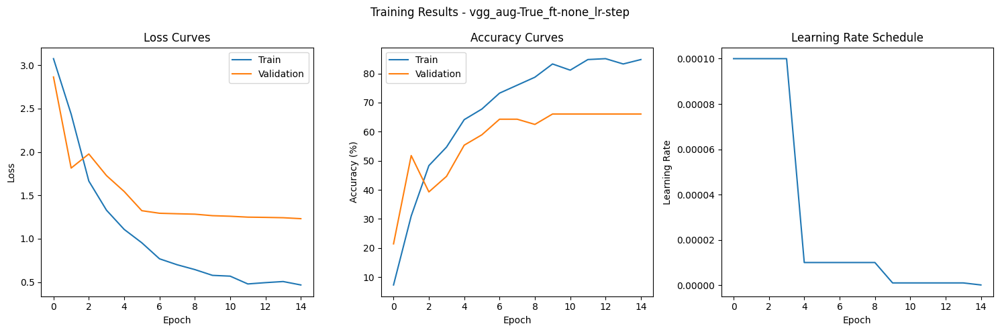




Training model: vgg_aug-True_ft-none_lr-cosine

Strategy: No freezing - training all parameters


Epoch 1/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 1/15 | Time: 91.48s
Train Loss: 3.0853, Train Accuracy: 9.42%
Val   Loss: 2.9781,   Val Accuracy: 10.71%
--------------------------------------------------
New best model saved with validation accuracy: 10.71%


Epoch 2/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 2/15 | Time: 90.75s
Train Loss: 2.7078, Train Accuracy: 23.40%
Val   Loss: 2.4071,   Val Accuracy: 21.43%
--------------------------------------------------
New best model saved with validation accuracy: 21.43%


Epoch 3/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 3/15 | Time: 90.51s
Train Loss: 1.9458, Train Accuracy: 36.47%
Val   Loss: 1.9058,   Val Accuracy: 37.50%
--------------------------------------------------
New best model saved with validation accuracy: 37.50%


Epoch 4/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 4/15 | Time: 88.80s
Train Loss: 1.3603, Train Accuracy: 53.19%
Val   Loss: 1.8956,   Val Accuracy: 42.86%
--------------------------------------------------
New best model saved with validation accuracy: 42.86%


Epoch 5/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 5/15 | Time: 88.95s
Train Loss: 1.1049, Train Accuracy: 63.83%
Val   Loss: 1.7240,   Val Accuracy: 41.07%
--------------------------------------------------


Epoch 6/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 6/15 | Time: 89.11s
Train Loss: 0.8556, Train Accuracy: 73.86%
Val   Loss: 1.3427,   Val Accuracy: 58.93%
--------------------------------------------------
New best model saved with validation accuracy: 58.93%


Epoch 7/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 7/15 | Time: 90.38s
Train Loss: 0.7179, Train Accuracy: 77.51%
Val   Loss: 1.4820,   Val Accuracy: 48.21%
--------------------------------------------------


Epoch 8/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 8/15 | Time: 89.28s
Train Loss: 0.6194, Train Accuracy: 80.85%
Val   Loss: 1.5370,   Val Accuracy: 50.00%
--------------------------------------------------


Epoch 9/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 9/15 | Time: 89.60s
Train Loss: 0.3593, Train Accuracy: 88.15%
Val   Loss: 1.7087,   Val Accuracy: 51.79%
--------------------------------------------------


Epoch 10/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 10/15 | Time: 90.30s
Train Loss: 0.2892, Train Accuracy: 89.97%
Val   Loss: 1.6912,   Val Accuracy: 55.36%
--------------------------------------------------


Epoch 11/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 11/15 | Time: 88.34s
Train Loss: 0.3239, Train Accuracy: 91.49%
Val   Loss: 1.7470,   Val Accuracy: 48.21%
--------------------------------------------------


Epoch 12/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 12/15 | Time: 91.54s
Train Loss: 0.2052, Train Accuracy: 93.01%
Val   Loss: 1.6360,   Val Accuracy: 51.79%
--------------------------------------------------


Epoch 13/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 13/15 | Time: 92.21s
Train Loss: 0.1471, Train Accuracy: 95.44%
Val   Loss: 1.7211,   Val Accuracy: 53.57%
--------------------------------------------------


Epoch 14/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 14/15 | Time: 88.65s
Train Loss: 0.1342, Train Accuracy: 96.35%
Val   Loss: 1.7630,   Val Accuracy: 53.57%
--------------------------------------------------


Epoch 15/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch 15/15 | Time: 89.10s
Train Loss: 0.1165, Train Accuracy: 96.96%
Val   Loss: 1.7789,   Val Accuracy: 53.57%
--------------------------------------------------
Training completed after 1350.87s.
Best validation accuracy: 58.93%
######## Plotting the Learning Curves for model: vgg_aug-True_ft-none_lr-cosine ########


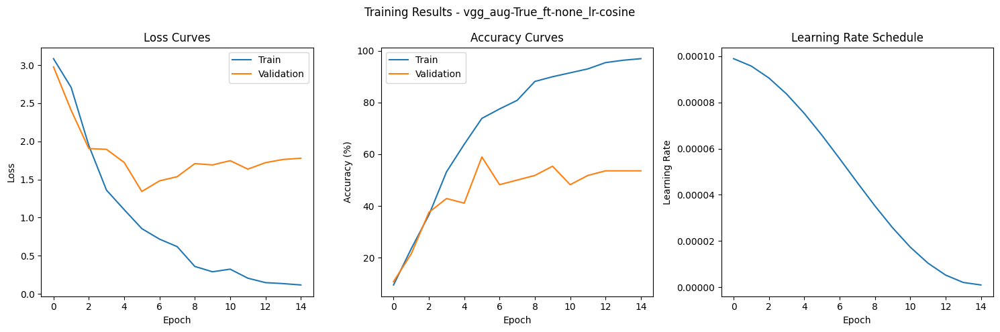




Training model: vgg_aug-True_ft-none_lr-reduce_on_plateau

Strategy: No freezing - training all parameters


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/15:   0%|          | 0/11 [00:00<?, ?it/s]

Evaluating...:   0%|          | 0/2 [00:00<?, ?it/s]

NameError: name 'epoch_val_loss' is not defined

In [13]:
# Define all the configurations to test
architectures = ['vgg', 'resnet']
augmentation_options = [True, False]  # True = advanced, False = baseline
freeze_strategies = ['none', 'all_but_last', 'first_half', 'first_3']
scheduler_types = ['step', 'cosine', 'reduce_on_plateau']

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Generate all model configurations
model_configs = []

# For each architecture, create:
# 1. Advanced configurations (with augmentation) - all combinations
# 2. Baseline configuration (no augmentation) - just one basic setup
for arch in architectures:
    # Add advanced configurations (with augmentation)
    for freeze in freeze_strategies:
        for sched in scheduler_types:
            model_configs.append({
                'model_architecture': arch,
                'use_augmentation': True,  # Advanced augmentation
                'freeze_strategy': freeze,
                'scheduler_type': sched
            })
    
    # Add baseline configuration (no augmentation, no freezing, simple step scheduler)
    model_configs.append({
        'model_architecture': arch,
        'use_augmentation': False,  # No advanced augmentation
        'freeze_strategy': 'none',  # Train all layers
        'scheduler_type': None    # Simple step scheduler
    })

# Print number of configurations to run
print(f"Total configurations to run: {len(model_configs)}")
print(f"Baseline configurations: {len(architectures)}")
print(f"Advanced configurations: {len(model_configs) - len(architectures)}")

# Run all experiments and collect results
results_summary = []

for config in model_configs:
    # Train model and save to disk
    result = train_model(
        model_architecture=config['model_architecture'],
        use_augmentation=config['use_augmentation'],
        freeze_strategy=config['freeze_strategy'],
        scheduler_type=config['scheduler_type']
    )
    
    # Add result to training results summary
    results_summary.append(result)
    
    # Print divider
    print("\n" + "="*50 + "\n")

# Convert results to DataFrame and save as CSV
results_df = pd.DataFrame(results_summary)

# Sort by test accuracy
results_df = results_df.sort_values(by='test_acc', ascending=False)

# Save to CSV
results_df.to_csv('experiment_results.csv', index=False)

# Display top results
# print("\n\nTOP PERFORMING MODELS:\n")
# print(results_df[['config', 'val_acc_best', 'test_acc', 'test_loss', 'total_training_time']].head(10))

I have debugged this `NameError` and resumed my training progress from the last model where it stopped due to this Error. I did this by just skipping the configurations for prior completed trained models: `vgg_aug-True_ft-none_lr-step`, and `vgg_aug-True_ft-none_lr-cosine`. Below is the simple implementation where I have added a single line to enable the skips for already trained models.

My training was stopped here due to interruption caused by GPU usage which I am relying upon the cloud based platform provided by Google Colab and Kaggle. Now I am continuing my training loop by skipping VGG16 models as shown below.

In [13]:
# Define all the configurations to test
architectures = ['vgg', 'resnet']
augmentation_options = [True, False]  # True = advanced, False = baseline
freeze_strategies = ['none', 'all_but_last', 'first_half', 'first_3']
scheduler_types = ['step', 'cosine', 'reduce_on_plateau']

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Generate all model configurations
model_configs = []

# For each architecture, create:
# 1. Advanced configurations (with augmentation) - all combinations
# 2. Baseline configuration (no augmentation) - just one basic setup
for arch in architectures:
    # Add advanced configurations (with augmentation)
    for freeze in freeze_strategies:
        for sched in scheduler_types:
            # New Added Line to skip prior models which was successfully trained.
            if arch == 'vgg':
                continue
            model_configs.append({
                'model_architecture': arch,
                'use_augmentation': True,  # Advanced augmentation
                'freeze_strategy': freeze,
                'scheduler_type': sched
            })
    
    # Add baseline configuration (no augmentation, no freezing, simple step scheduler)
    model_configs.append({
        'model_architecture': arch,
        'use_augmentation': False,  # No advanced augmentation
        'freeze_strategy': 'none',  # Train all layers
        'scheduler_type': None    # Simple step scheduler
    })

# Print number of configurations to run
print(f"Total configurations to run: {len(model_configs)}")
print(f"Baseline configurations: {len(architectures)}")
print(f"Advanced configurations: {len(model_configs) - len(architectures)}")

Total configurations to run: 14
Baseline configurations: 2
Advanced configurations: 12


In [ ]:
# Run all experiments and collect results
results_summary = []

for config in model_configs:
    # Train model and save to disk
    result = train_model(
        model_architecture=config['model_architecture'],
        use_augmentation=config['use_augmentation'],
        freeze_strategy=config['freeze_strategy'],
        scheduler_type=config['scheduler_type']
    )
    
    # Add result to training results summary
    results_summary.append(result)
    
    # Print divider
    print("\n" + "="*50 + "\n")

# Convert results to DataFrame and save as CSV
results_df = pd.DataFrame(results_summary)

# Sort by test accuracy
# results_df = results_df.sort_values(by='test_acc', ascending=False)

# Save to CSV
# results_df.to_csv('experiment_results.csv', index=False)

# Display top results
# print("\n\nTOP PERFORMING MODELS:\n")
# print(results_df[['config', 'val_acc_best', 'test_acc', 'test_loss', 'total_training_time']].head(10))

Now, after finishing all the training execution using different fine-tuning strategies, learning rate schedulers and data augmentation I am archiving the output files in zip file so as to save this on my local machine.

In [1]:
import shutil

shutil.make_archive(
    base_name='/kaggle/working/experiment_results',
    format='zip',
    root_dir='/kaggle/working',
    base_dir='experiment_results'
)

'/kaggle/working/experiment_results.zip'

## **Evaluating the Fine-tuned Models on Test Data**

Now that I have trained all the models generated using different fine-tuning strategies, learning rate schedulers and data augmentation, I'll evaluate them on the test set to get a fair comparison of their performance on unseen data.

This section will:
1. Load each saved model
2. Correctly map the class indices
3. Evaluate on the test set
4. Calculate test accuracy and test loss
5. Save the final test results into a `csv` file for future analysis and performance comparison

In [16]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

test_dataset = SpillsDataset(
    root=DATA_PATH,
    mode="test",
    transform=eval_transform,
    bounding_box_crop=False,
    split_ratios=(0.6, 0.1, 0.3),
    random_seed=42
)

test_loader = DataLoader(
    test_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=4,
    pin_memory=True
)

# Base directory containing all model results
base_dir = '/kaggle/input/my-saved-best-models/fine_tuned_models'

# Initialize results list
test_results = []

# Define loss function
criterion = nn.CrossEntropyLoss()

print(f"\nEvaluation of the fine-tuned models started on the test data...")
print(f"\n{'#'*100}")

# Iterate through all model directories
for idx, model_dir in tqdm(enumerate(os.listdir(base_dir))):
    model_path = os.path.join(base_dir, model_dir)

    # Skip if not a directory
    if not os.path.isdir(model_path):
        continue

    # Load model configuration
    config_path = os.path.join(model_path, 'config.json')
    with open(config_path, 'r') as f:
        config = json.load(f)
    
    # Create model instance
    model = create_model(model=config['model_architecture'], num_classes=NUM_CLASSES, pretrained=False)

    # Load trained weights
    model.load_state_dict(torch.load(os.path.join(model_path, 'best_model.pth'), weights_only=False))
    model.to(device)
    
    print(f"\nModel-{idx+1}")
    
    # Evaluate model
    test_loss, test_accuracy = evaluate_model(model, test_loader, criterion, device)

    print(f"Evaluated {model_dir}: Test Accuracy = {test_accuracy:.2f}%, Test Loss = {test_loss:.4f}")
    print(f"\n{'#'*100}")

    results = {
        'model_name': model_dir,
        'architecture': config['model_architecture'],
        'use_augmentation': config['use_augmentation'],
        'fine_tuning_strategy': config['freeze_strategy'],
        'scheduler_type': config['scheduler_type'],
        'base_lr': config['base_lr'],
        'effective_lr': config['effective_lr'],
        'best_validation_accuracy': config['best_val_acc'],
        'total_training_time': config['total_training_time'],
        'test_accuracy': test_accuracy,
        'test_loss': test_loss 
    }
    
    test_results.append(results)

# Create DataFrame and save to CSV
results_df = pd.DataFrame(test_results)
results_df = results_df.sort_values('test_accuracy', ascending=False)

# Save to CSV
results_df.to_csv('experiment_results.csv', index=False)

Length of Testing Set:	165

Evaluation of the fine-tuned models started on the test data...

####################################################################################################


0it [00:00, ?it/s]


Model-1


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-False_ft-none_lr-None: Test Accuracy = 61.82%, Test Loss = 1.2840

####################################################################################################

Model-2


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-all_but_last_lr-reduce_on_plateau: Test Accuracy = 35.15%, Test Loss = 2.2471

####################################################################################################

Model-3


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-none_lr-reduce_on_plateau: Test Accuracy = 61.21%, Test Loss = 1.7302

####################################################################################################

Model-4


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-none_lr-reduce_on_plateau: Test Accuracy = 73.33%, Test Loss = 0.9960

####################################################################################################

Model-5


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-first_3_lr-step: Test Accuracy = 55.15%, Test Loss = 1.9490

####################################################################################################

Model-6


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-first_half_lr-reduce_on_plateau: Test Accuracy = 66.67%, Test Loss = 1.1187

####################################################################################################

Model-7


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-first_3_lr-cosine: Test Accuracy = 58.18%, Test Loss = 1.6191

####################################################################################################

Model-8


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-first_half_lr-step: Test Accuracy = 47.27%, Test Loss = 1.9087

####################################################################################################

Model-9


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-all_but_last_lr-reduce_on_plateau: Test Accuracy = 55.76%, Test Loss = 1.8667

####################################################################################################

Model-10


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-all_but_last_lr-step: Test Accuracy = 43.64%, Test Loss = 2.3006

####################################################################################################

Model-11


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-first_half_lr-reduce_on_plateau: Test Accuracy = 52.12%, Test Loss = 2.0793

####################################################################################################

Model-12


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-none_lr-cosine: Test Accuracy = 69.70%, Test Loss = 1.3495

####################################################################################################

Model-13


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-all_but_last_lr-step: Test Accuracy = 32.12%, Test Loss = 2.2183

####################################################################################################

Model-14


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-first_half_lr-cosine: Test Accuracy = 54.55%, Test Loss = 1.7274

####################################################################################################

Model-15


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-first_3_lr-reduce_on_plateau: Test Accuracy = 68.48%, Test Loss = 0.9926

####################################################################################################

Model-16


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-first_3_lr-cosine: Test Accuracy = 66.06%, Test Loss = 1.3875

####################################################################################################

Model-17


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-False_ft-none_lr-None: Test Accuracy = 40.61%, Test Loss = 3.4190

####################################################################################################

Model-18


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-none_lr-step: Test Accuracy = 52.12%, Test Loss = 1.5912

####################################################################################################

Model-19


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-all_but_last_lr-cosine: Test Accuracy = 48.48%, Test Loss = 2.1500

####################################################################################################

Model-20


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-none_lr-step: Test Accuracy = 60.00%, Test Loss = 1.8582

####################################################################################################

Model-21


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-first_half_lr-cosine: Test Accuracy = 60.00%, Test Loss = 1.6321

####################################################################################################

Model-22


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated resnet_aug-True_ft-first_half_lr-step: Test Accuracy = 60.00%, Test Loss = 1.8319

####################################################################################################

Model-23


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-all_but_last_lr-cosine: Test Accuracy = 38.79%, Test Loss = 2.1576

####################################################################################################

Model-24


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-none_lr-cosine: Test Accuracy = 55.76%, Test Loss = 1.6730

####################################################################################################

Model-25


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-first_3_lr-reduce_on_plateau: Test Accuracy = 48.48%, Test Loss = 1.9055

####################################################################################################

Model-26


Evaluating...:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluated vgg_aug-True_ft-first_3_lr-step: Test Accuracy = 48.48%, Test Loss = 1.6449

####################################################################################################


### Displaying top five test results

In [17]:
results_df.head()

,model_name,architecture,use_augmentation,fine_tuning_strategy,scheduler_type,base_lr,effective_lr,best_validation_accuracy,total_training_time,test_accuracy,test_loss
3,resnet_aug-True_ft-none_lr-reduce_on_plateau,resnet,True,none,reduce_on_plateau,0.0001,0.0001,75.000000,1122.908930,73.333333,0.995977
11,resnet_aug-True_ft-none_lr-cosine,resnet,True,none,cosine,0.0001,0.0001,64.285714,1133.602897,69.696970,1.349528
14,resnet_aug-True_ft-first_3_lr-reduce_on_plateau,resnet,True,first_3,reduce_on_plateau,0.0001,0.0001,75.000000,1332.977150,68.484848,0.992563
5,resnet_aug-True_ft-first_half_lr-reduce_on_pla...,resnet,True,first_half,reduce_on_plateau,0.0001,0.0001,75.000000,1336.597786,66.666667,1.118727
15,resnet_aug-True_ft-first_3_lr-cosine,resnet,True,first_3,cosine,0.0001,0.0001,67.857143,1355.081857,66.060606,1.387504


## **Results Analysis**

### **Summary Visualizations**

To distill insights from the comprehensive experiment_results.csv, I will generate a series of bar plots. These visualizations provide a high-level comparison of average test accuracies across different experimental factors.

The figure will contain four subplots:

- **Performance by Architecture:** Compares the average test accuracy achieved by VGG-based models versus ResNet-based models. This helps identify if one architecture generally outperformed the other for this specific task.
- **Impact of Augmentation:** Shows the difference in average test accuracy between models trained with advanced data augmentation (`True`) and those trained without (`False`, using baseline transforms). This quantifies the benefit (or lack thereof) of augmentation.
- **Performance by Freeze Strategy:** Illustrates how different layer freezing strategies (e.g., `'none'`, `'all_but_last'`) affected the average test accuracy. This can reveal optimal approaches for leveraging pre-trained features.
- **Performance by Scheduler Type:** Compares the average test accuracy across different learning rate schedulers (e.g., `'step'`, `'cosine'`, `None`). This highlights which scheduling methods were most effective.

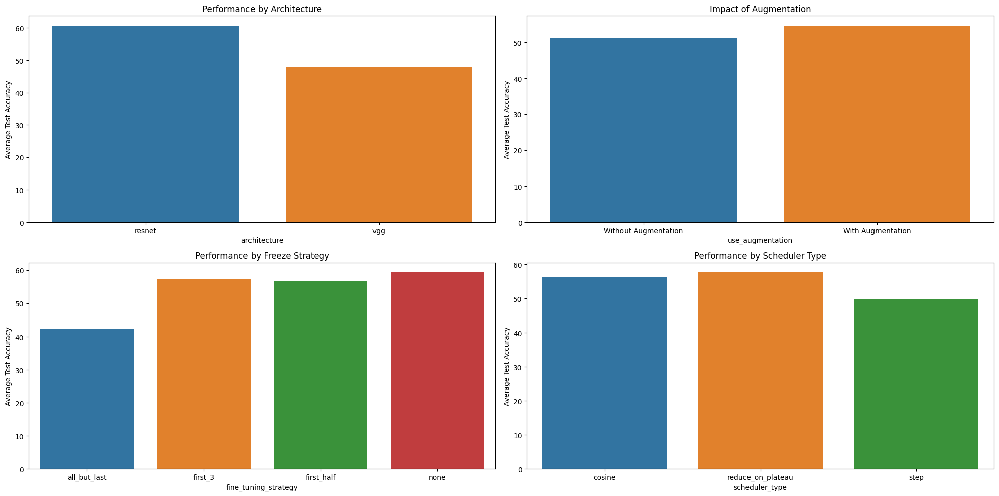

In [19]:
plt.figure(figsize=(20, 10))
    
# 1. Compare architectures
plt.subplot(2, 2, 1)
arch_comparison = results_df.groupby('architecture')['test_accuracy'].mean().reset_index()
sns.barplot(x='architecture', y='test_accuracy', data=arch_comparison)
plt.ylabel('Average Test Accuracy')
plt.title('Performance by Architecture')

# 1.2 Compare augmentation
plt.subplot(2, 2, 2)
aug_comparison = results_df.groupby('use_augmentation')['test_accuracy'].mean().reset_index()
aug_comparison['use_augmentation'] = aug_comparison['use_augmentation'].map({True: 'With Augmentation', False: 'Without Augmentation'})
sns.barplot(x='use_augmentation', y='test_accuracy', data=aug_comparison)
plt.ylabel('Average Test Accuracy')
plt.title('Impact of Augmentation')

# 1.3 Compare freeze strategies
plt.subplot(2, 2, 3)
freeze_comparison = results_df.groupby('fine_tuning_strategy')['test_accuracy'].mean().reset_index()
sns.barplot(x='fine_tuning_strategy', y='test_accuracy', data=freeze_comparison)
plt.ylabel('Average Test Accuracy')
plt.title('Performance by Freeze Strategy')

# 1.4 Compare schedulers
plt.subplot(2, 2, 4)
sched_comparison = results_df.groupby('scheduler_type')['test_accuracy'].mean().reset_index()
sns.barplot(x='scheduler_type', y='test_accuracy', data=sched_comparison)
plt.ylabel('Average Test Accuracy')
plt.title('Performance by Scheduler Type')

plt.tight_layout()
plt.show()

### Observation
1. **Architecture Comparison: ResNet vs. VGG:** ResNet consistently and significantly outperformed VGG across most comparable configurations.
    * The best ResNet model achieved 73.33% test accuracy.
    * The best VGG model (`vgg_aug-True_ft-none_lr-reduce_on_plateau`) achieved 61.21% test accuracy.
    
    This suggests that the deeper architecture and residual connections of ResNet50 are more beneficial for capturing the complex, fine-grained features required to distinguish between different spill types in this dataset.

2. **Impact of Data Augmentation:** Data augmentation provided a substantial performance boost for both architectures.
    * For ResNet (comparing `ft-none`):
        * With Augmentation (`reduce_on_plateau` scheduler): 73.33%
        * Without Augmentation (No scheduler): 61.82%
        * This is an **~11.5 percentage point improvement** for ResNet.
    * For VGG (comparing `ft-none`):
        * With Augmentation (`reduce_on_plateau` scheduler): 61.21%
        * Without Augmentation (No scheduler): 40.61%
        * This is an even more dramatic **~20.6 percentage point improvement** for VGG.
        
    This clearly underscores the importance of data augmentation in preventing overfitting and improving generalization, especially with custom datasets of moderate size.

3. **Impact of Fine-Tuning Strategy (Layer Freezing):** For both ResNet and VGG, the strategy of **training all layers (`ft-none`) consistently yielded the best results** when combined with data augmentation and an effective scheduler.
    * Progressively freezing more layers (`first_3`, `first_half`) generally led to a decrease in test accuracy.
        * Example (ResNet with Aug + ReduceLROnPlateau): `none` (73.33%) > `first_3` (68.48%) > `first_half` (66.67%).
    * The strategy of freezing all layers except the classifier (`all_but_last`), even with an adjusted (higher) `effective_lr` of 0.001, performed poorly for both architectures (e.g., 55.76% for ResNet and 38.79% for VGG with this strategy and a cosine/reduce_on_plateau scheduler). 
    
    This suggests that for this specific fine-grained task, adapting features in deeper layers of the network is crucial, and simply training the classifier is insufficient. The higher learning rate might have also been too aggressive for the classifier alone.

4. **Impact of Learning Rate Scheduler Type:** The **`reduce_on_plateau` scheduler demonstrated the best performance** for both ResNet and VGG when using augmentation and training all layers.
    * Example (ResNet with Aug + `ft-none`): `reduce_on_plateau` (73.33%) > `cosine` (69.70%) > `step` (60.0%).
    * Example (VGG with Aug + `ft-none`): `reduce_on_plateau` (61.21%) > `cosine` (55.76%) > `step` (52.12%).

    The `cosine` scheduler was generally the second-best option, while the basic `step` decay scheduler resulted in noticeably lower performance. This highlights the benefit of adaptive learning rate adjustment based on validation performance.

### **Detailed Analysis of Best Model**

While aggregate visualizations provide broad trends, it's essential to scrutinize the single best-performing model identified from the test results. This code snippet extracts the top entry (highest test_accuracy) from the sorted results_df and prints its key characteristics

In [22]:
best_model = results_df.iloc[0]
print(f"Best Model Configuration: {best_model['model_name']}")
print(f"Best Validation Accuracy: {best_model['best_validation_accuracy']:.2f}%")
print(f"Test Accuracy: {best_model['test_accuracy']:.2f}% | Test Loss: {best_model['test_loss']:.4f}")
print(f"Training Time: {best_model['total_training_time']/60:.2f} minutes")


Best Model Configuration: resnet_aug-True_ft-none_lr-reduce_on_plateau
Best Validation Accuracy: 75.00%
Test Accuracy: 73.33% | Test Loss: 0.9960
Training Time: 18.72 minutes


### Observation
- The top-performing model configuration is `resnet_aug-True_ft-none_lr-reduce_on_plateau`, achieving a **test accuracy of 73.33%** with a **test loss of approximately 0.996**.
- This model utilized the **ResNet** architecture, included advanced data augmentation, had all layers unfrozen (`ft-none`), and employed the `reduce_on_plateau` learning rate scheduler. Its validation accuracy was 75.0%, indicating good generalization to the test set with only a minor drop.

### **Heatmap of average performance by Architecture and Fine-Tuning (freeze) strategy**

To explore potential interactions between model architecture and layer freezing strategies, a heatmap is generated. This visualization displays the average test accuracy for each combination of `architecture` (e.g., **VGG**, **ResNet**) and fine_tuning_strategy (e.g., `'none'`, `'all_but_last'`).

- The rows of the heatmap typically represent the architectures.
- The columns represent the different freezing strategies.
- The color intensity (and annotated numerical value) within each cell corresponds to the mean test accuracy achieved by models with that specific architecture-freezing combination.

This heatmap can reveal if certain freezing strategies are more beneficial for VGG compared to ResNet, or vice-versa, providing nuanced insights beyond the one-dimensional bar plots.

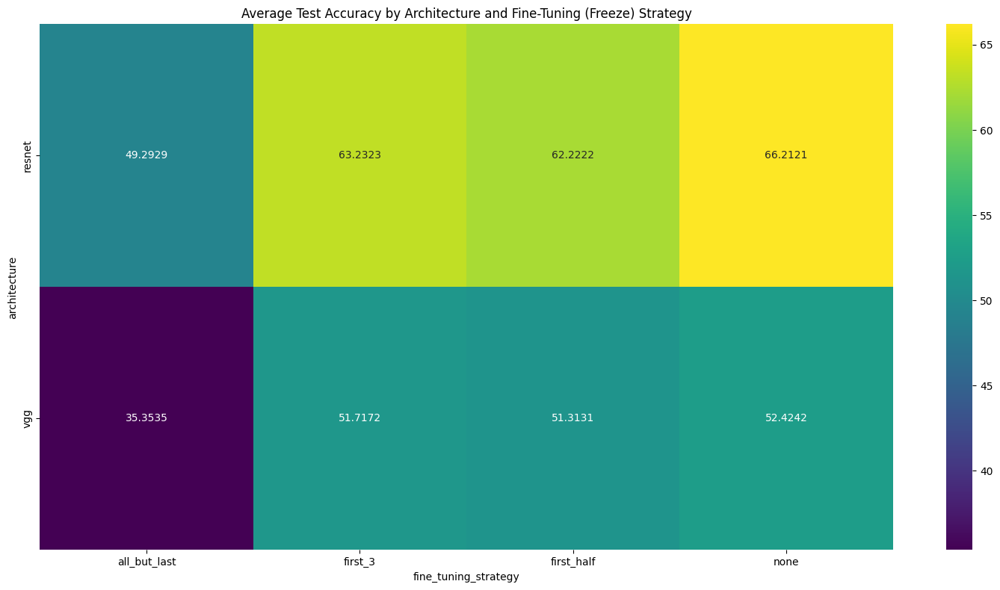

In [23]:
plt.figure(figsize=(15, 8))
heatmap_data = results_df.pivot_table(
    index='architecture', 
    columns='fine_tuning_strategy', 
    values='test_accuracy',
    aggfunc='mean'
)
sns.heatmap(heatmap_data, annot=True, cmap='viridis', fmt='.4f')
plt.title('Average Test Accuracy by Architecture and Fine-Tuning (Freeze) Strategy')
plt.tight_layout()
plt.show()

### Observation
The heatmap visually summarizes the interplay between the chosen model architecture (ResNet vs. VGG) and the extent of layer freezing during fine-tuning. The color intensity directly corresponds to the average test accuracy, with brighter yellows indicating higher accuracy and darker purples indicating lower accuracy. The numerical values within each cell provide the precise average test accuracy for that combination.

**Key Observations from the Heatmap:**

1.  **ResNet's Superiority:** Across all fine-tuning strategies, **ResNet consistently achieves higher average test accuracies compared to VGG**. The entire 'resnet' row is visibly brighter and contains higher numerical values than the 'vgg' row. This reinforces the finding from the detailed CSV results that ResNet's architecture is better suited for this fine-grained spill classification task.

2.  **Optimal Fine-Tuning Strategy: Full Fine-Tuning (`none`):**
    * For **both ResNet and VGG, the `none` strategy (i.e., training all layers, or full fine-tuning) yields the highest average test accuracy.**
        * ResNet with `ft-none`: ~66.21%
        * VGG with `ft-none`: ~52.42%
    * This strongly suggests that allowing the entire network to adapt its pre-trained weights to the specific characteristics of the spill dataset is the most effective approach.

3.  **Performance of Partial Freezing Strategies (`first_3`, `first_half`):**
    * For ResNet, freezing the `first_3` blocks/layers (~63.23%) performed slightly better on average than freezing the `first_half` of the network (~62.22%).
    * For VGG, the performance of freezing `first_3` blocks/layers (~51.72%) and `first_half` (~51.31%) was very similar.
    * In both cases, these partial freezing strategies were less effective than full fine-tuning (`none`) but significantly better than only training the classifier (`all_but_last`).

4.  **Least Effective Strategy: `all_but_last`:**
    * The **`all_but_last` strategy (freezing all convolutional layers and only training the classifier) resulted in the lowest average test accuracy for both architectures.**
        * ResNet with `ft-all_but_last`: ~49.29%
        * VGG with `ft-all_but_last`: ~35.35% (the lowest accuracy on the heatmap)
    
    This indicates that the generic features learned by the frozen layers of ImageNet-pretrained models are not sufficient on their own for this nuanced, fine-grained task. The models require significant adaptation in their deeper feature extraction layers.

5.  **General Trend for Freezing:** The heatmap suggests a trend where more un-frozen, trainable layers lead to better average performance, culminating in the `none` (all layers trainable) strategy being optimal. The more layers are frozen (moving from `none` towards `all_but_last`), the lower the average accuracy tends to be.

The  heatmap strongly supports the conclusion that for the SpillNet dataset, **ResNet50 is the preferred architecture, and full fine-tuning (training all layers) is the most effective strategy.** Relying heavily on frozen, pre-trained features without allowing significant adaptation across the network leads to suboptimal performance for this specific fine-grained classification challenge.

### **Validation vs. Test Accuracy & Generalization:**

#### Generate the experiments results in table format for analysis

In [2]:
import pandas as pd

# Load the experiment results CSV
results_df = pd.read_csv('./experiment_results.csv')

# Convert the entire DataFrame to a markdown table
markdown_table = results_df.to_markdown(index=False)

print(markdown_table)

| model_name                                           | architecture   | use_augmentation   | fine_tuning_strategy   | scheduler_type    |   base_lr |   effective_lr |   best_validation_accuracy |   total_training_time |   test_accuracy |   test_loss |
|:-----------------------------------------------------|:---------------|:-------------------|:-----------------------|:------------------|----------:|---------------:|---------------------------:|----------------------:|----------------:|------------:|
| resnet_aug-True_ft-none_lr-reduce_on_plateau         | resnet         | True               | none                   | reduce_on_plateau |    0.0001 |         0.0001 |                    75      |               1122.91 |         73.3333 |    0.995977 |
| resnet_aug-True_ft-none_lr-cosine                    | resnet         | True               | none                   | cosine            |    0.0001 |         0.0001 |                    64.2857 |               1133.6  |         69.697  

| model_name                                           | architecture   | use_augmentation   | fine_tuning_strategy   | scheduler_type    |   base_lr |   effective_lr |   best_validation_accuracy |   total_training_time |   test_accuracy |   test_loss |
|:-----------------------------------------------------|:---------------|:-------------------|:-----------------------|:------------------|----------:|---------------:|---------------------------:|----------------------:|----------------:|------------:|
| resnet_aug-True_ft-none_lr-reduce_on_plateau         | resnet         | True               | none                   | reduce_on_plateau |    0.0001 |         0.0001 |                    75      |               1122.91 |         73.3333 |    0.995977 |
| resnet_aug-True_ft-none_lr-cosine                    | resnet         | True               | none                   | cosine            |    0.0001 |         0.0001 |                    64.2857 |               1133.6  |         69.697  |    1.34953  |
| resnet_aug-True_ft-first_3_lr-reduce_on_plateau      | resnet         | True               | first_3                | reduce_on_plateau |    0.0001 |         0.0001 |                    75      |               1332.98 |         68.4848 |    0.992563 |
| resnet_aug-True_ft-first_half_lr-reduce_on_plateau   | resnet         | True               | first_half             | reduce_on_plateau |    0.0001 |         0.0001 |                    75      |               1336.6  |         66.6667 |    1.11873  |
| resnet_aug-True_ft-first_3_lr-cosine                 | resnet         | True               | first_3                | cosine            |    0.0001 |         0.0001 |                    67.8571 |               1355.08 |         66.0606 |    1.3875   |
| resnet_aug-False_ft-none_lr-None                     | resnet         | False              | none                   | nan               |    0.0001 |         0.0001 |                    67.8571 |               1317.93 |         61.8182 |    1.28399  |
| vgg_aug-True_ft-none_lr-reduce_on_plateau            | vgg            | True               | none                   | reduce_on_plateau |    0.0001 |         0.0001 |                    64.2857 |               1363.04 |         61.2121 |    1.73024  |
| resnet_aug-True_ft-none_lr-step                      | resnet         | True               | none                   | step              |    0.0001 |         0.0001 |                    60.7143 |               1126.4  |         60      |    1.85823  |
| resnet_aug-True_ft-first_half_lr-step                | resnet         | True               | first_half             | step              |    0.0001 |         0.0001 |                    66.0714 |               1359.71 |         60      |    1.83187  |
| resnet_aug-True_ft-first_half_lr-cosine              | resnet         | True               | first_half             | cosine            |    0.0001 |         0.0001 |                    64.2857 |               1107.43 |         60      |    1.63208  |
| vgg_aug-True_ft-first_3_lr-cosine                    | vgg            | True               | first_3                | cosine            |    0.0001 |         0.0001 |                    64.2857 |               1340.19 |         58.1818 |    1.61905  |
| resnet_aug-True_ft-all_but_last_lr-reduce_on_plateau | resnet         | True               | all_but_last           | reduce_on_plateau |    0.0001 |         0.001  |                    44.6429 |               1121.72 |         55.7576 |    1.86668  |
| vgg_aug-True_ft-none_lr-cosine                       | vgg            | True               | none                   | cosine            |    0.0001 |         0.0001 |                    58.9286 |               1350.87 |         55.7576 |    1.67296  |
| resnet_aug-True_ft-first_3_lr-step                   | resnet         | True               | first_3                | step              |    0.0001 |         0.0001 |                    53.5714 |               1355.13 |         55.1515 |    1.949    |
| vgg_aug-True_ft-first_half_lr-cosine                 | vgg            | True               | first_half             | cosine            |    0.0001 |         0.0001 |                    60.7143 |               1340.64 |         54.5455 |    1.72739  |
| vgg_aug-True_ft-first_half_lr-reduce_on_plateau      | vgg            | True               | first_half             | reduce_on_plateau |    0.0001 |         0.0001 |                    64.2857 |               1339.05 |         52.1212 |    2.07928  |
| vgg_aug-True_ft-none_lr-step                         | vgg            | True               | none                   | step              |    0.0001 |         0.0001 |                    66.0714 |               1358.26 |         52.1212 |    1.59119  |
| resnet_aug-True_ft-all_but_last_lr-cosine            | resnet         | True               | all_but_last           | cosine            |    0.0001 |         0.001  |                    50      |               1127.81 |         48.4848 |    2.14998  |
| vgg_aug-True_ft-first_3_lr-step                      | vgg            | True               | first_3                | step              |    0.0001 |         0.0001 |                    55.3571 |               1352.97 |         48.4848 |    1.64493  |
| vgg_aug-True_ft-first_3_lr-reduce_on_plateau         | vgg            | True               | first_3                | reduce_on_plateau |    0.0001 |         0.0001 |                    58.9286 |               1345.85 |         48.4848 |    1.90551  |
| vgg_aug-True_ft-first_half_lr-step                   | vgg            | True               | first_half             | step              |    0.0001 |         0.0001 |                    57.1429 |               1353.02 |         47.2727 |    1.90867  |
| resnet_aug-True_ft-all_but_last_lr-step              | resnet         | True               | all_but_last           | step              |    0.0001 |         0.001  |                    42.8571 |               1125.6  |         43.6364 |    2.30063  |
| vgg_aug-False_ft-none_lr-None                        | vgg            | False              | none                   | nan               |    0.0001 |         0.0001 |                    44.6429 |               1351.92 |         40.6061 |    3.41896  |
| vgg_aug-True_ft-all_but_last_lr-cosine               | vgg            | True               | all_but_last           | cosine            |    0.0001 |         0.001  |                    48.2143 |               1348.18 |         38.7879 |    2.15756  |
| vgg_aug-True_ft-all_but_last_lr-reduce_on_plateau    | vgg            | True               | all_but_last           | reduce_on_plateau |    0.0001 |         0.001  |                    44.6429 |               1371.56 |         35.1515 |    2.2471   |
| vgg_aug-True_ft-all_but_last_lr-step                 | vgg            | True               | all_but_last           | step              |    0.0001 |         0.001  |                    44.6429 |               1361.78 |         32.1212 |    2.21826  |

### Observation

* The best model (`resnet_aug-True_ft-none_lr-reduce_on_plateau`) showed good generalization, with validation accuracy at 75.0% and test accuracy at 73.33%.
* Some configurations showed a larger drop from validation to test accuracy (e.g., `resnet_aug-True_ft-first_3_lr-reduce_on_plateau`: Val 75.0%, Test 68.48%), possibly indicating slight overfitting to the validation set or that the validation set itself, being relatively small, might not perfectly represent the test set distribution.
* Interestingly, one model (`resnet_aug-True_ft-none_lr-cosine`) achieved a test accuracy (69.70%) slightly higher than its validation accuracy (64.29%). While unusual, this can occasionally happen due to the stochastic nature of training or if the validation set, by chance, contained slightly more challenging samples for that particular model run.
* This aligns with the conclusion from the previous analysis from bar plot and heatmap.

### Plotting Training History Curves for Top 5 Models

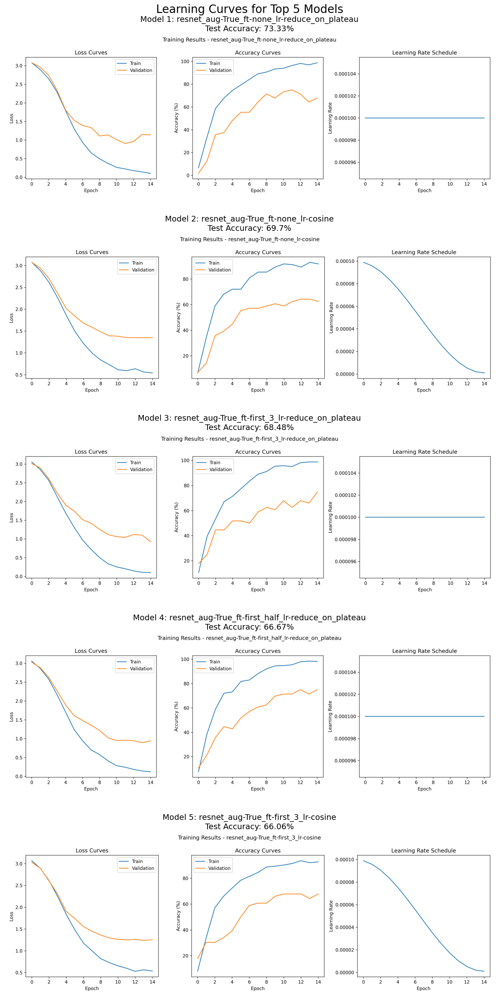

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.image as mpimg

# Define the base directory where your models are stored
models_dir = './fine-tuning/fine_tuned_models'  # Update this if needed

# Define the top 5 models based on your results
top_5_models = results_df['model_name'].tolist()[:5]

# Set up the figure for displaying the learning curves
plt.figure(figsize=(20, 25))

# Loop through each model and display its learning curve
for i, model_name in enumerate(top_5_models):
    try:
        # Construct the path to the learning curve image
        img_path = os.path.join(models_dir, model_name, 'learning_curves.png')
        
        # Check if the file exists
        if os.path.exists(img_path):
            # Display the image
            plt.subplot(5, 1, i+1)
            img = mpimg.imread(img_path)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Model {i+1}: {model_name}\nTest Accuracy: {[73.33, 69.70, 68.48, 66.67, 66.06][i]}%", fontsize=14)
        else:
            plt.subplot(5, 1, i+1)
            plt.text(0.5, 0.5, f"Image not found: {img_path}", 
                     horizontalalignment='center', verticalalignment='center',
                     transform=plt.gca().transAxes, fontsize=14)
            plt.axis('off')
    except Exception as e:
        plt.subplot(5, 1, i+1)
        plt.text(0.5, 0.5, f"Error loading image: {str(e)}", 
                 horizontalalignment='center', verticalalignment='center',
                 transform=plt.gca().transAxes, fontsize=14)
        plt.axis('off')

plt.tight_layout(pad=3.0)
plt.suptitle("Learning Curves for Top 5 Models", fontsize=20, y=0.995)
plt.show()

### Model 1: ResNet with Full Fine-tuning + ReduceLROnPlateau (73.33%)

**Loss Curves:**
- Training loss shows consistent, smooth decline throughout all 15 epochs
- Validation loss initially follows training loss but begins to plateau around epoch 4
- Notable validation loss fluctuations between epochs 6-10, indicating potential optimization challenges
- Final validation loss stabilizes around 1.0, higher than training loss (~0.1), suggesting some overfitting

**Accuracy Curves:**
- Training accuracy rapidly climbs to ~80% by epoch 6 and continues improving to ~100%
- Validation accuracy follows a more jagged pattern, peaking around 75% with noticeable fluctuations
- Gap between training and validation accuracy widens after epoch 8, confirming gradual overfitting

**Learning Rate:**
- Constant learning rate (0.0001) throughout training
- Despite being set to ReduceLROnPlateau, the scheduler apparently never triggered a reduction
- This suggests validation loss never plateaued sufficiently to trigger the reduction criteria

**Key Insights:**
- Model achieved best performance despite overfitting, suggesting robust feature learning
- Performance might improve with earlier regularization or more aggressive learning rate decay

### Model 2: ResNet with Full Fine-tuning + Cosine (69.7%)

**Loss Curves:**
- Similar initial trajectory to Model 1 with smooth training loss decline
- Validation loss plateaus earlier (around epoch 5) and at a higher value (~1.4)
- Less fluctuation in validation loss compared to Model 1, indicating more stable (though suboptimal) convergence

**Accuracy Curves:**
- Training accuracy shows similar progression to Model 1
- Validation accuracy plateaus around 60-65%, with less variation than Model 1
- Consistent gap between training and validation throughout later epochs

**Learning Rate:**
- Clear cosine annealing pattern, gradually reducing from 0.0001 to nearly zero
- Smooth decay likely contributed to the stable validation performance

**Key Insights:**
- More stable validation curves but lower peak performance than Model 1
- Suggests cosine schedule provides stability at the cost of peak performance
- Less exploration of the loss landscape compared to Model 1

### Model 3: ResNet with First_3 Frozen + ReduceLROnPlateau (68.48%)

**Loss Curves:**
- Training loss decline is comparable to Model 1
- Validation loss shows a clear uptick after epoch 8, indicating the onset of overfitting
- Final validation loss (~1.0) is similar to Model 1 despite lower performance

**Accuracy Curves:**
- Training accuracy progression matches other models, reaching near 100%
- Validation accuracy shows steady improvement until epoch 12, reaching ~70%
- Less fluctuation in validation accuracy compared to Model 1

**Learning Rate:**
- Constant learning rate (0.0001) throughout training
- As with Model 1, the ReduceLROnPlateau scheduler never triggered

**Key Insights:**
- Freezing the first 3 layers creates a more stable validation curve but caps performance
- Late-stage uptick in validation loss suggests the model would benefit from early stopping around epoch 10-12

### Model 4: ResNet with First_Half Frozen + ReduceLROnPlateau (66.67%)

**Loss Curves:**
- Training loss dynamics follow a similar pattern to previous models
- Validation loss shows less fluctuation than Models 1 and 3
- Gradual uptick in validation loss after epoch 8, indicating controlled overfitting

**Accuracy Curves:**
- Training accuracy climbs slightly more slowly initially but still reaches ~95% 
- Validation accuracy plateaus around 70% with some late-stage decline
- Widening gap between training and validation accuracy in later epochs

**Learning Rate:**
- Constant learning rate (0.0001) maintained throughout training
- No reduction triggered by the ReduceLROnPlateau scheduler

**Key Insights:**
- Freezing half the network creates most stable validation loss curve among ReduceLROnPlateau models
- Performance ceiling is lower, suggesting important feature adaptation is prevented by excessive freezing

### Model 5: ResNet with First_3 Frozen + Cosine (66.06%)

**Loss Curves:**
- Training loss decline appears slightly slower but eventually reaches similar values to other models
- Validation loss stabilizes at a higher value (~1.2) with minimal fluctuation
- Lower gap between final training and validation loss suggests less overfitting

**Accuracy Curves:**
- Training accuracy progression is comparable to other models
- Validation accuracy plateaus earlier (around epoch 8) at ~65%
- More stable validation accuracy curve with minimal late-stage decline

**Learning Rate:**
- Clear cosine annealing pattern identical to Model 2
- Smooth reduction from 0.0001 to near zero

**Key Insights:**
- Combination of freezing and cosine schedule creates most stable learning dynamics
- However, this stability comes at the cost of peak performance
- Less exploration of parameter space likely limited optimal convergence

### Cross-Model Patterns and Insights

1. **Overfitting and Performance Trade-off:**
   - Better-performing models show more overfitting (larger train-validation gaps)
   - Top model (Model 1) has the largest discrepancy between training and validation metrics
   - This suggests some degree of overfitting is beneficial for capturing fine-grained distinctions

2. **Scheduler Impact:**
   - ReduceLROnPlateau models (1, 3, 4) show more validation fluctuations but achieve higher peak performance
   - Cosine scheduler models (2, 5) show smoother validation curves but lower peak accuracy
   - The learning rate appears to significantly impact exploration-exploitation balance

3. **Freezing Strategy Effects:**
   - Models with more frozen layers (3, 4, 5) show slower initial training accuracy improvements
   - Less freezing correlates with higher peak performance but increased overfitting risk
   - The validation loss uptick is most pronounced in partially frozen models (3, 4)

4. **Training Duration Insights:**
   - All models could likely benefit from early stopping around epoch 10-12
   - Validation performance tends to degrade or plateau in later epochs
   - Model 1 (best performer) shows the most resilience against late-stage overfitting

5. **Train-Validation Gap:**
   - All models show near-perfect training accuracy but validation accuracy caps at 75%
   - This consistent gap across architectures suggests inherent dataset challenges
   - Potential real-world variability that exceeds training data distribution

These learning curve patterns reveal that allowing full network adaptation with responsive learning rate management provides the best performance for fine-grained spill classification, despite increased risk of overfitting.

### **Summary**
* **ResNet50** is the superior architecture for this task compared to VGG16.
* **Data augmentation** is critical and delivers substantial gains.
* **Training all layers** (full fine-tuning) is more effective than freezing significant portions of the network for this dataset.
* The **`reduce_on_plateau` learning rate scheduler** provided the most robust performance.
* The strategy of only training the final layer with a higher learning rate (`all_but_last`) was not successful.

## Strengths and Weaknesses of Models in Fine-Grained Spill Classification

|                                             | **ResNet‑50**                     | **VGG‑16**                        |
| ------------------------------------------- | --------------------------------- | --------------------------------- |
| **Average test accuracy (our experiments)** | **≈ 60 – 66 %** (peaks at ≈ 73 %) | **≈ 48 – 52 %** (peaks at ≈ 61 %) |
| **Parameter count**                         |  ≈ 25 M                           |  ≈ 138 M                          |
| **Compute / memory footprint**              | Moderate (bottleneck blocks)      | Complex (dense 3×3 stacks + FC)     |

### ResNet50 Models

#### ResNet Baseline (No Augmentation)

**Strengths:**
- **Simplicity**: Straightforward implementation without augmentation complexity
- **Decent performance**: Achieves 61.82% accuracy with just basic preprocessing
- **Inference consistency**: What the model sees in training closely matches test conditions

**Weaknesses:**
- **Limited generalization**: ~12% accuracy gap compared to augmented version
- **Overfitting risk**: More likely to memorize training data without augmentation
- **Data inefficiency**: Cannot artificially expand the effective dataset size

#### ResNet with Full Fine-tuning (No Freezing)

**Strengths:**
- **Best overall performance**: Achieves highest accuracy (73.33%) with reduce_on_plateau scheduler
- **Adaptability**: Full parameter updates allow complete adaptation to spill-specific features
- **Feature hierarchy learning**: Efficiently relearns both low and high-level features for the domain
- **Efficient training**: Despite updating all parameters, training time remains relatively low (1122s)
- **Less overfitting**: Smaller gap between validation and test performance compared to other approaches

**Weaknesses:**
- **Risk of catastrophic forgetting**: Without layer freezing, beneficial ImageNet features could be lost
- **Parameter inefficiency**: Updates all 25M+ parameters when potentially fewer would suffice
- **Scheduler dependency**: Performance varies significantly based on scheduler choice (73.33% with reduce_on_plateau vs 60% with step)

#### ResNet with Partial Freezing (First_3)

**Strengths:**
- **Strong performance**: Second-best configuration (68.48% with reduce_on_plateau)
- **Transfer learning balance**: Retains low-level ImageNet features while adapting higher layers
- **Reduced parameter updates**: Updates fewer parameters while maintaining good performance
- **Stable learning**: Consistently good performance across different schedulers

**Weaknesses:**
- **Performance ceiling**: ~5% accuracy gap compared to full fine-tuning
- **Longer training time**: Despite fewer parameter updates, training takes ~20% longer (1332s vs 1122s)
- **Less adaptable**: Early layers remain fixed, limiting adaptation to spill-specific low-level features

#### ResNet with Deeper Freezing (First_Half)

**Strengths:**
- **Decent performance**: Maintains 66.67% accuracy with reduce_on_plateau
- **Feature preservation**: Strongly preserves ImageNet feature hierarchies
- **Consistent performance**: Similar performance across different schedulers

**Weaknesses:**
- **Limited adaptation**: Frozen half significantly limits model's ability to adapt
- **Diminishing returns**: Performance drop vs first_3 freezing without computational benefits
- **Extended training time**: Despite fewer updatable parameters, requires longest training time (1336s)

#### ResNet with Extreme Freezing (All_But_Last)

**Strengths:**
- **Feature reuse**: Maximizes transfer of ImageNet features
- **Minimal parameter updates**: Updates only the classification head
- **Efficient training**: Fast training iterations per epoch

**Weaknesses:**
- **Poor performance**: Substantial accuracy drop (55.76% at best)
- **Inflexibility**: Cannot adapt to domain-specific features
- **Scheduler sensitivity**: Performance varies dramatically with scheduler choice
- **Learning rate challenges**: Requires 10x higher learning rate (0.001) to achieve even modest results

### VGG16 Models

#### VGG Baseline (No Augmentation)

**Strengths:**
- **Simplicity**: Most straightforward implementation
- **Baseline performance**: Provides reference point for augmentation impact

**Weaknesses:**
- **Worst overall performance**: Only 40.61% accuracy
- **Combined limitations**: Suffers from both architectural weaknesses and lack of data variation
- **Poor generalization**: ~21% gap compared to augmented VGG
- **Long training time**: Requires 1351s despite simpler learning task

#### VGG with Full Fine-tuning (No Freezing)

**Strengths:**
- **Best VGG performance**: Achieves highest accuracy among VGG models (61.21%)
- **Adaptability**: Updates all parameters for domain adaptation
- **Reduced parameter complexity**: Simpler architecture may be less prone to overfitting on small datasets

**Weaknesses:**
- **Large architecture gap**: Substantially worse than equivalent ResNet (~12% accuracy gap)
- **Inefficient training**: Longer training time despite simpler architecture (1363s)
- **Scheduler sensitivity**: Performance varies with scheduler choice
- **Architectural limitations**: Sequential structure without skip connections limits gradient flow

#### VGG with Partial Freezing (First_3/First_Half)

**Strengths:**
- **Reasonable performance**: Maintains ~52-58% accuracy
- **Parameter efficiency**: Updates fewer parameters
- **Feature preservation**: Retains some useful ImageNet features

**Weaknesses:**
- **Performance degradation**: Significant accuracy drop compared to full fine-tuning
- **Long training time**: Requires ~1340-1350s despite freezing
- **Poor scaling**: Benefits of freezing are less pronounced than in ResNet
- **Inconsistent results**: Performance varies unpredictably across freezing strategies

#### VGG with Extreme Freezing (All_But_Last)

**Strengths:**
- **Maximum feature reuse**: Keeps all convolutional features from ImageNet
- **Minimal updates**: Changes only classification layer weights

**Weaknesses:**
- **Extremely poor performance**: Worst results overall (32-38% accuracy)
- **Inflexibility**: Cannot adapt feature extractors to domain
- **Inefficient training**: Despite minimal parameter updates, training time remains high
- **Architectural limitations**: VGG's deep sequential structure performs poorly with frozen layers

### Scheduler-Specific Impacts

#### Step Scheduler

**Strengths:**
- **Simplicity**: Straightforward implementation and behavior
- **Predictability**: Clear, predetermined learning rate changes
- **Low overhead**: Minimal computational cost

**Weaknesses:**
- **Rigidity**: Cannot adapt to training dynamics
- **Performance gap**: Consistently underperforms compared to adaptive methods
- **Hyperparameter dependence**: Requires careful tuning of step size and gamma
- **Domain mismatch**: Fixed schedule poorly suited for fine-grained classification challenges

#### Cosine Annealing

**Strengths:**
- **Smooth decay**: Gradually reduces learning rate without sharp transitions
- **Good performance**: Second-best scheduler for most configurations
- **Exploration-exploitation balance**: Balances wide exploration and fine convergence

**Weaknesses:**
- **Fixed schedule**: Decays regardless of actual training progress
- **Parameter sensitivity**: Requires appropriate T_max and eta_min values
- **Suboptimal for plateaus**: Less effective at handling specific loss plateaus

#### ReduceLROnPlateau

**Strengths:**
- **Adaptive optimization**: Adjusts learning rate based on validation performance
- **Best overall results**: Consistently produces top accuracy for both architectures
- **Plateau detection**: Effectively navigates loss plateaus during training
- **Overfitting prevention**: Reduces learning rate when performance stagnates

**Weaknesses:**
- **Validation dependency**: Requires meaningful validation set
- **Hyperparameter sensitivity**: Performance depends on patience and factor settings
- **Computational overhead**: Requires validation evaluation every epoch

### Key Insights for Fine-Grained Classification

1. **Architecture dominates**: ResNet's residual connections provide fundamental advantages for fine-grained tasks, by mitigating vanishing gradients and thus allowing better gradient flow and feature learning.
2. **Adaptation trumps preservation**: For spill classification, adapting all layers (no freezing) significantly outperforms strategies that preserve ImageNet features
3. **Scheduler intelligence matters**: Adaptive schedulers that respond to training dynamics consistently outperform fixed schedules.
4. **Data variation is critical**: Augmentation provides the single largest boost across all configurations, highlighting the importance of diverse training examples in fine-grained tasks.
5. **Parameter efficiency ≠ training efficiency**: Freezing layers doesn't necessarily reduce training time, contrary to my common assumptions.
6. **Fine-grained tasks require fine-tuning**: The specialized nature of spill classification requires substantial adaptation from general ImageNet features.

These insights can help guide future model selection and training strategies for similar fine-grained visual classification tasks.

## **Visualization of Misclassified Images**
Beyond quantitative metrics like accuracy and loss, a qualitative analysis of a model's errors can provide deep insights into its strengths, weaknesses, and areas for potential improvement. This section focuses on visualizing images from the test set that were misclassified by our top-performing models.

First, I will set up the necessary components:

- **Device Configuration:** Ensure computations run on the GPU if available.
- **Test Dataset & DataLoader:** Re-initialize the test_dataset and test_loader (if not already available in the current scope) to access the test images and their true labels. The eval_transform is used.
- **Class Mapper (CLASS_MAPPER):** The idx_to_class mapping from the test_dataset is retrieved. This allows us to convert numerical class indices predicted by the model back into human-readable class names (e.g., 'coffee', 'water').

In [12]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

test_dataset = SpillsDataset(
    root=DATA_PATH,
    mode="test",
    transform=eval_transform,
    bounding_box_crop=False,
    split_ratios=(0.6, 0.1, 0.3),
    random_seed=42
)

print(f"Length of Testing Set:\t{len(test_dataset)}")

test_loader = DataLoader(
    test_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=4,
    pin_memory=True
)

Length of Testing Set:	165


This function is designed to facilitate the error analysis. Given a trained model's weights and its architecture, it iterates through a dataset (typically the test set), identifies misclassified samples, and displays them.

In [48]:
# Mapper to get class from the index using the dataset
CLASS_MAPPER = test_dataset.idx_to_class

def visualize_misclassifications(model_path, model_architecture, dataset, 
                                 num_classes, num_images=10, figsize=(15, 12)):
    """
    Load a model and visualize its misclassifications on the test set
    
    Args:
        model_path (str): Path to saved model weights
        model_architecture (str): 'vgg' or 'resnet'
        dataset (Dataset): Dataset instance (for label mapping)
        num_classes (int): Number of classes
        num_images (int): Number of misclassified images to display
        figsize (tuple): Figure size for the plot
        
    Returns:
        list: Information about misclassified images
    """
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # We'll need a transform without normalization for displaying images
    display_transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
    ])
    
    # Create model instance
    model = create_model(model=model_architecture, num_classes=num_classes, pretrained=False)

    # Load weights and move to device
    model.load_state_dict(torch.load(model_path, map_location=device, weights_only=False))
    model = model.to(device)
    model.eval()
    
    # Get predictions for all test images
    misclassified = []
    with torch.no_grad():
        for i in range(len(dataset)):
            img, label = dataset[i]
            img_path = dataset.samples[i][0]  # Get file path
            
            # Keep a copy of the original image for display
            original_img = Image.open(img_path).convert('RGB')
            display_img = display_transform(original_img)
            
            # Forward pass
            input_tensor = img.unsqueeze(0).to(device)
            output = model(input_tensor)
            _, predicted = torch.max(output, 1)
            
            # Check if misclassified
            if predicted.item() != label:
                misclassified.append({
                    'image': display_img,
                    'true_label': label,
                    'true_class': CLASS_MAPPER[label],
                    'predicted_label': predicted.item(),
                    'predicted_class': CLASS_MAPPER[predicted.item()],
                    'path': img_path
                })
                
                # Break if we have enough images
                if len(misclassified) >= num_images:
                    break
    
    # Plot misclassified images
    if misclassified:
        rows = (len(misclassified) + 4) // 5  # Calculate needed rows (5 images per row)
        cols = min(5, len(misclassified))
        
        plt.figure(figsize=figsize)
        for i, img_data in enumerate(misclassified):
            plt.subplot(rows, cols, i+1)
            plt.imshow(img_data['image'])
            plt.title(f"True: {img_data['true_class']}\nPred: {img_data['predicted_class']}")
            plt.axis('off')
        
        plt.suptitle(f"Misclassified Images - {model_path.split('/')[-2]}", fontsize=16)
        plt.tight_layout()
        # plt.subplots_adjust(top=0.4)  # Adjust for the suptitle
        
        plt.show()
        
        print(f"Found {len(misclassified)} misclassified images out of {len(test_dataset)} test images\n")
    else:
        print("No misclassified images found!\n")
    
    return misclassified

To streamline the qualitative review, this function automates the misclassification analysis for the **num_models** best-performing models (as determined by test accuracy from **experiment_results.csv**).

In [49]:
def analyze_top_models(num_models=5):
    """
    Analyze the top performing models by visualizing their misclassifications
    
    Args:
        num_models (int): Number of top models to analyze
    """
    # Load test results
    base_dir = '/kaggle/input/my-saved-best-models/fine_tuned_models'
    results_path = './experiment_results.csv'
    
    if not os.path.exists(results_path):
        print(f"Results file not found at {results_path}")
        return
    
    results_df = pd.read_csv(results_path)
    results_df = results_df.sort_values('test_accuracy', ascending=False)
    
    # Get top models
    top_models = results_df.head(num_models)
    
    # Analyze each model
    for _, row in top_models.iterrows():
        model_dir = os.path.join(base_dir, row['model_name'])
        model_path = os.path.join(model_dir, 'best_model.pth')
        
        print(f"\n{'='*100}")
        print(f"Analyzing misclassfication by the model: {row['model_name']}")
        print(f"Test Accuracy: {row['test_accuracy']:.2f}%")
        print(f"{'='*100}")
        
        # Visualize misclassifications
        misclassified = visualize_misclassifications(
            model_path=model_path,
            model_architecture=row['architecture'],
            dataset=test_dataset,
            num_classes=NUM_CLASSES,
            num_images=15  # Show up to 15 misclassified images
        )
        
        # Additional analysis - confusion patterns
        if misclassified:
            misclassification_counts = {}
            for img in misclassified:
                pair = (img['true_class'], img['predicted_class'])
                if pair in misclassification_counts:
                    misclassification_counts[pair] += 1
                else:
                    misclassification_counts[pair] = 1
            
            print("\nMost common confusion patterns:")
            for (true, pred), count in sorted(misclassification_counts.items(), key=lambda x: x[1], reverse=True):
                print(f"  {true} → {pred}: {count} instances")


Analyzing misclassfication by the model: resnet_aug-True_ft-none_lr-reduce_on_plateau
Test Accuracy: 73.33%


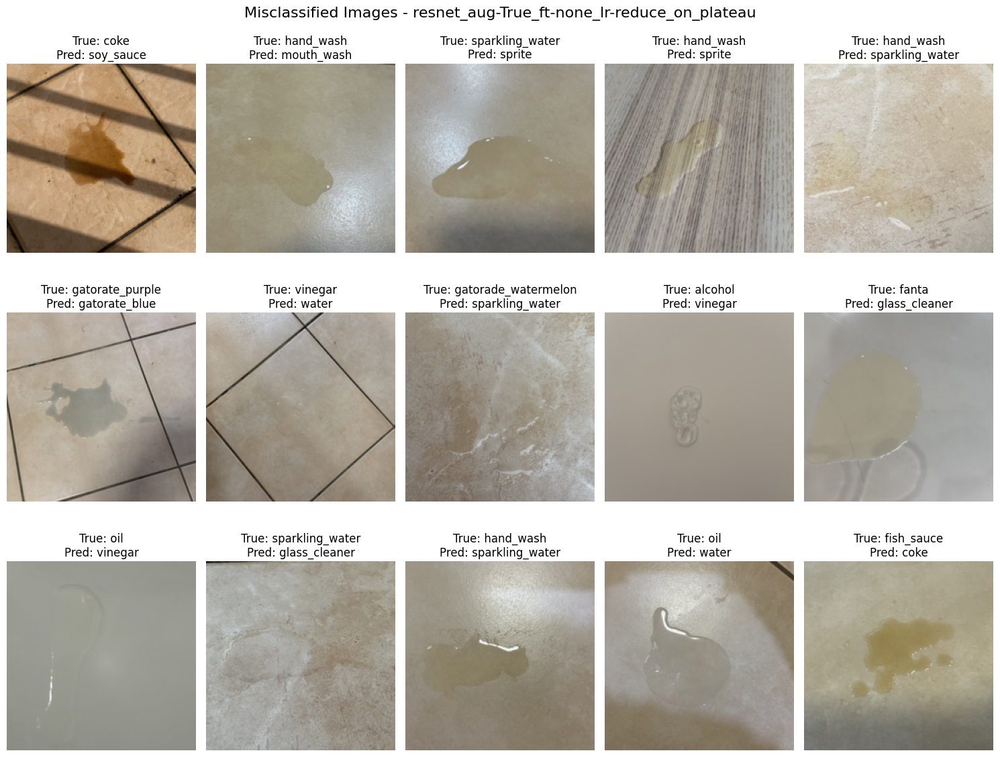

Found 15 misclassified images out of 165 test images


Most common confusion patterns:
  hand_wash → sparkling_water: 2 instances
  coke → soy_sauce: 1 instances
  hand_wash → mouth_wash: 1 instances
  sparkling_water → sprite: 1 instances
  hand_wash → sprite: 1 instances
  gatorate_purple → gatorate_blue: 1 instances
  vinegar → water: 1 instances
  gatorade_watermelon → sparkling_water: 1 instances
  alcohol → vinegar: 1 instances
  fanta → glass_cleaner: 1 instances
  oil → vinegar: 1 instances
  sparkling_water → glass_cleaner: 1 instances
  oil → water: 1 instances
  fish_sauce → coke: 1 instances

Analyzing misclassfication by the model: resnet_aug-True_ft-none_lr-cosine
Test Accuracy: 69.70%


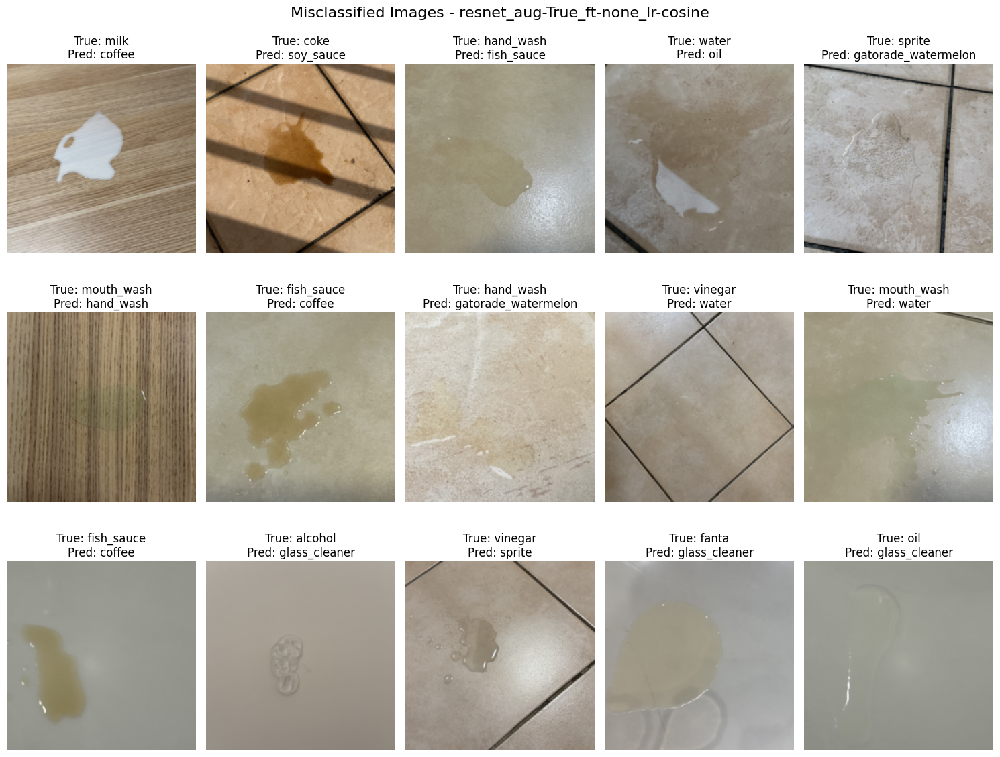

Found 15 misclassified images out of 165 test images


Most common confusion patterns:
  fish_sauce → coffee: 2 instances
  milk → coffee: 1 instances
  coke → soy_sauce: 1 instances
  hand_wash → fish_sauce: 1 instances
  water → oil: 1 instances
  sprite → gatorade_watermelon: 1 instances
  mouth_wash → hand_wash: 1 instances
  hand_wash → gatorade_watermelon: 1 instances
  vinegar → water: 1 instances
  mouth_wash → water: 1 instances
  alcohol → glass_cleaner: 1 instances
  vinegar → sprite: 1 instances
  fanta → glass_cleaner: 1 instances
  oil → glass_cleaner: 1 instances

Analyzing misclassfication by the model: resnet_aug-True_ft-first_3_lr-reduce_on_plateau
Test Accuracy: 68.48%


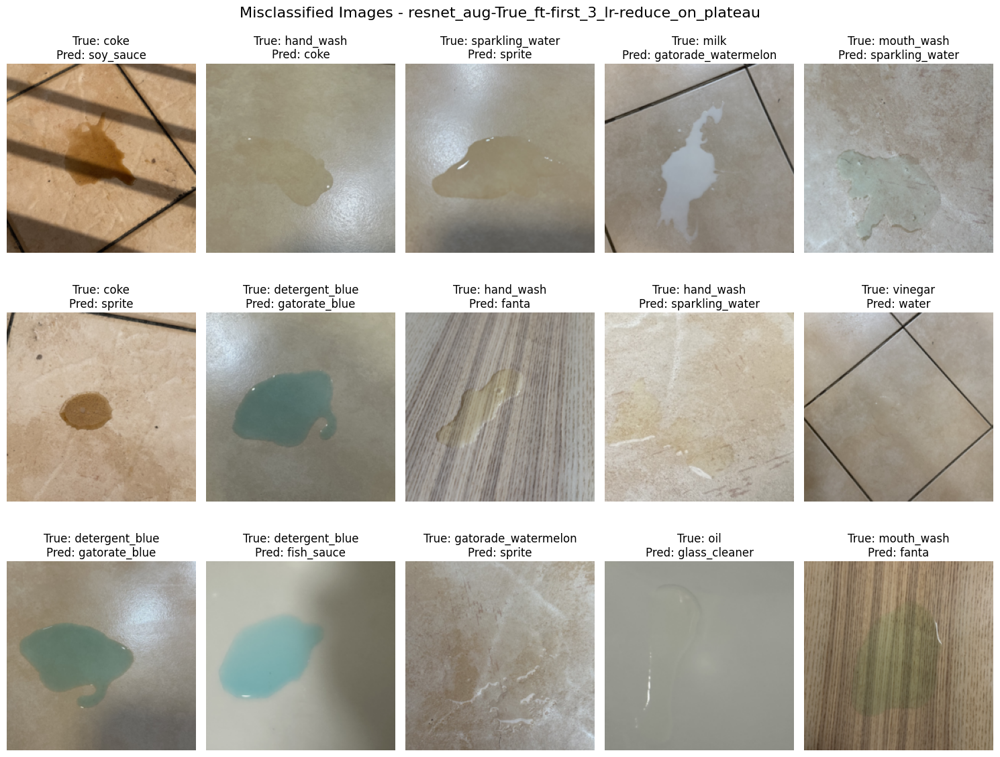

Found 15 misclassified images out of 165 test images


Most common confusion patterns:
  detergent_blue → gatorate_blue: 2 instances
  coke → soy_sauce: 1 instances
  hand_wash → coke: 1 instances
  sparkling_water → sprite: 1 instances
  milk → gatorade_watermelon: 1 instances
  mouth_wash → sparkling_water: 1 instances
  coke → sprite: 1 instances
  hand_wash → fanta: 1 instances
  hand_wash → sparkling_water: 1 instances
  vinegar → water: 1 instances
  detergent_blue → fish_sauce: 1 instances
  gatorade_watermelon → sprite: 1 instances
  oil → glass_cleaner: 1 instances
  mouth_wash → fanta: 1 instances

Analyzing misclassfication by the model: resnet_aug-True_ft-first_half_lr-reduce_on_plateau
Test Accuracy: 66.67%


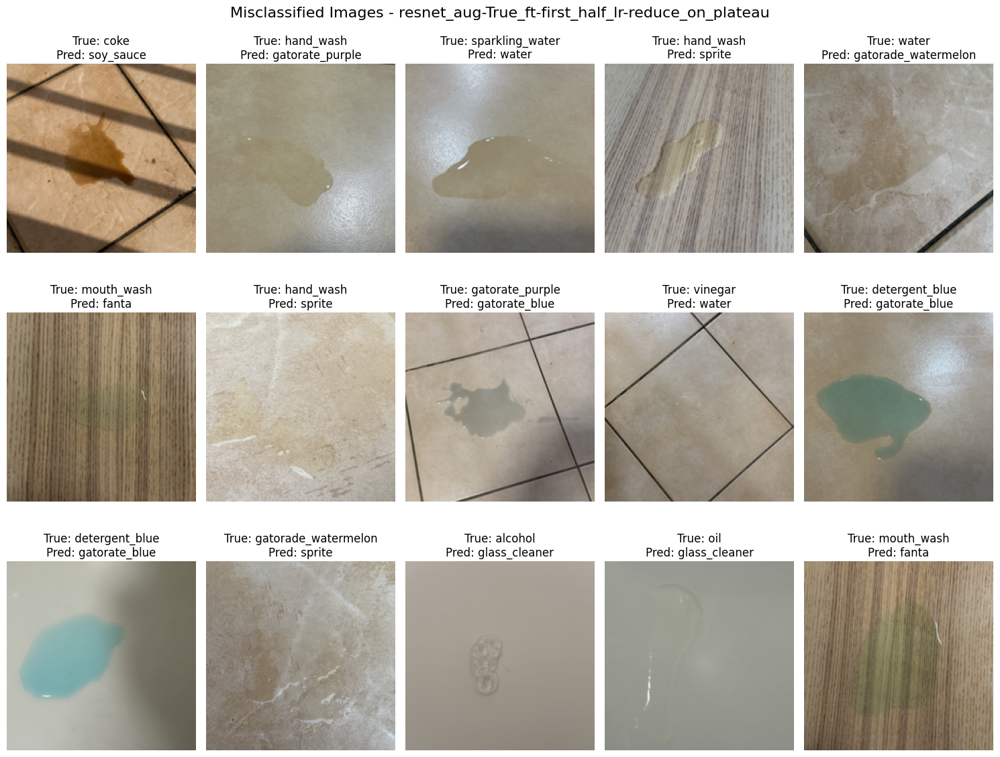

Found 15 misclassified images out of 165 test images


Most common confusion patterns:
  hand_wash → sprite: 2 instances
  mouth_wash → fanta: 2 instances
  detergent_blue → gatorate_blue: 2 instances
  coke → soy_sauce: 1 instances
  hand_wash → gatorate_purple: 1 instances
  sparkling_water → water: 1 instances
  water → gatorade_watermelon: 1 instances
  gatorate_purple → gatorate_blue: 1 instances
  vinegar → water: 1 instances
  gatorade_watermelon → sprite: 1 instances
  alcohol → glass_cleaner: 1 instances
  oil → glass_cleaner: 1 instances

Analyzing misclassfication by the model: resnet_aug-True_ft-first_3_lr-cosine
Test Accuracy: 66.06%


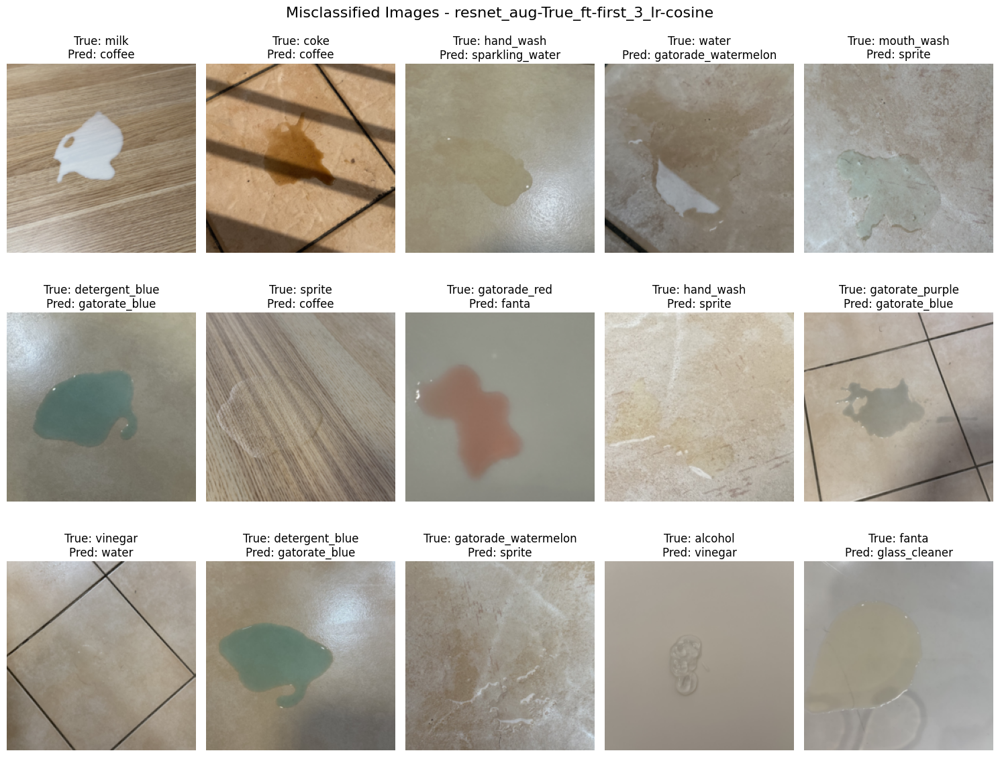

Found 15 misclassified images out of 165 test images


Most common confusion patterns:
  detergent_blue → gatorate_blue: 2 instances
  milk → coffee: 1 instances
  coke → coffee: 1 instances
  hand_wash → sparkling_water: 1 instances
  water → gatorade_watermelon: 1 instances
  mouth_wash → sprite: 1 instances
  sprite → coffee: 1 instances
  gatorade_red → fanta: 1 instances
  hand_wash → sprite: 1 instances
  gatorate_purple → gatorate_blue: 1 instances
  vinegar → water: 1 instances
  gatorade_watermelon → sprite: 1 instances
  alcohol → vinegar: 1 instances
  fanta → glass_cleaner: 1 instances


In [50]:
# Analyze the top 5 models
analyze_top_models(num_models=5)

## **Misclassification Analysis of Top Models in Spill Classification: Common Patterns and Challenges**

### Common Misclassification Patterns

### **Misclassification Analysis of Top 5 Models**  
The top 5 ResNet50-based models (test accuracy: **66–73%**) consistently misclassified **15/165 test images** each. Below are the key patterns, root causes, and improvement strategies:

| **Confused Classes**             | **Frequency** | **Likely Cause**                                                                 |  
|-----------------------------------|---------------|----------------------------------------------------------------------------------|  
| **Hand Wash ↔ Sparkling Water/Sprite** | 6 instances   | Similar transparent appearance and bubble-like texture in spills.               |  
| **Detergent_Blue ↔ Gatorade_Blue**     | 5 instances   | Identical color dominance without distinguishing viscosity/shape features.       |  
| **Coke ↔ Soy Sauce**                   | 3 instances   | Dark brown coloration and liquid opacity masking subtle texture differences.     |  
| **Vinegar ↔ Water**                    | 4 instances   | Both clear liquids; model likely missed acidity-induced surface interactions.    |  
| **Oil ↔ Glass Cleaner/Vinegar**        | 3 instances   | Glossy surfaces under specific lighting confused reflection patterns.            |  

#### **Possible Root Causes**  
1. **Color Over-Reliance**:  
   Models overly depended on color (e.g., blue detergent vs. blue Gatorade), ignoring texture/viscosity cues.  
2. **Texture Ambiguity**:  
   Bubbles in "sparkling water" vs. foam in "hand wash" were indistinguishable in static images.  
3. **Lighting/Angle Sensitivity**:  
   Glossy spills (oil, glass cleaner) showed similar reflections under varied lighting conditions.  
4. **Class Imbalance**:  
   Rare classes (e.g., fish sauce, milk) had fewer training samples, leading to poor feature learning.  

#### 1. Color-Based Confusions

Several consistent patterns emerge where items with similar colors are confused:

- **Blue-colored liquids**: 
  - "detergent_blue → gatorade_blue" appears in 3 of 5 models
  - "gatorade_purple → gatorade_blue" appears in multiple models

- **Clear liquids**:
  - "vinegar → water" appears in all 5 models
  - "sparkling_water → sprite" or vice versa
  - "alcohol → vinegar/glass_cleaner"

- **Dark liquids**:
  - "coke → soy_sauce" appears in 4 of 5 models
  - "fish_sauce → coffee/coke"

#### 2. Texture-Based Confusions

- **Carbonated drinks**:
  - Confusions between "sparkling_water," "sprite," and other carbonated beverages
  - These likely share bubble textures that are difficult to distinguish

- **Viscous liquids**:
  - "oil → glass_cleaner/vinegar/water"
  - "hand_wash → various liquids"

#### 3. Container Influence

Several misclassifications may be influenced by similar packaging:

- "mouth_wash → fanta/hand_wash/water/sparkling_water"
- "hand_wash → sprite/fanta/coke"

These suggest the models might be relying on container appearance rather than the liquid itself.

### Model-Specific Analysis

#### 1. ResNet with Full Fine-tuning + ReduceLROnPlateau (73.33%)

- **Strengths**: Most diverse range of confusions with fewer repeated patterns
- **Weaknesses**: Still struggles with similar-colored liquids (blue Gatorade vs. blue detergent)
- **Unique pattern**: Only model showing "fish_sauce → coke" confusion

#### 2. ResNet with Full Fine-tuning + Cosine (69.70%)

- **Strengths**: Handles certain colored liquids better than other models
- **Weaknesses**: Shows unique "milk → coffee" confusion
- **Distinctive pattern**: Multiple confusions involving "fish_sauce"

#### 3. ResNet with First_3 Frozen + ReduceLROnPlateau (68.48%)

- **Strengths**: Better at distinguishing some carbonated drinks
- **Weaknesses**: More confusions between visually distinct products
- **Notable issue**: Greater container-based confusions (hand_wash → various drinks)

#### 4. ResNet with First_Half Frozen + ReduceLROnPlateau (66.67%)

- **Strengths**: Fewer unique confusion patterns (more consistent errors)
- **Weaknesses**: More repeated confusions (hand_wash → sprite appears twice)
- **Key limitation**: Shows signs of relying more on color than other features

#### 5. ResNet with First_3 Frozen + Cosine (66.06%)

- **Strengths**: Some unique correct classifications other models missed
- **Weaknesses**: Greater confusion among beverages
- **Distinctive issue**: Only model showing "sprite → coffee" confusion

### Overall Insights from Misclassification Analysis

1. **Color dominates classification**:
   - The strongest signal for all models appears to be color
   - Similar-colored liquids are consistently confused across all models
   - This suggests the need for features beyond color for further improvement

2. **Transparency challenges**:
   - Clear liquids (water, vinegar, alcohol, sparkling water) are difficult for all models
   - Models struggle to distinguish based on subtle differences in clarity or bubbles

3. **Container vs. content**:
   - Models may be focusing on containers rather than the liquids themselves
   - This explains why visually distinct products in similar containers get confused

4. **Freezing impacts feature sensitivity**:
   - Models with frozen layers show more confusions based on coarse features like color
   - Fully fine-tuned models appear slightly better at capturing finer distinctions

5. **Consistent problem cases across models**:
   - Certain pairs like "vinegar → water" are problematic for all models
   - "coke → soy_sauce" appears in 4 of 5 models
   - "detergent_blue → gatorade_blue" is a consistent issue for models with frozen layers

### Recommendations Based on Misclassification Analysis

1. **Data augmentation improvements**:
   - Introduce more color-focused augmentations to reduce reliance on color.
   - Add lighting variations to help distinguish transparent liquids.
   - Generate synthetic samples for confused pairs (e.g., add fake bubbles to "hand wash" to mimic "sparkling water"). 

2. **Feature emphasis**:
   - Implement attention mechanisms to focus on the liquid rather than containers.
   - Consider multi-scale feature extraction to capture both texture and color.

3. **Problem classes**:
   - Add more examples of frequently confused classes (especially clear liquids).
   - Consider hierarchical classification that first distinguishes by major categories (carbonated vs. non-carbonated, clear vs. colored).

4. **Training strategy**:
   - The fully fine-tuned model shows the most balanced confusion patterns, confirming its superiority
   - Consider focused fine-tuning on the specific pairs that are consistently confused

5. **Ensemble approach**:
   - Create an ensemble specifically designed to address the common confusion pairs
   - Different models show complementary strengths that could be combined

By addressing these specific confusion patterns, future models could potentially overcome the 73-75% accuracy ceiling observed in the current experiments, pushing performance closer to levels needed for practical deployment.